In [ ]:
!pip install iterative-stratification
!pip install tensorflow-addons

     |████████████████████████████████| 1.1 MB 14.5 MB/s 


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Set up the environment

In [ ]:
import os
import numpy as np, os, sys, joblib
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import tarfile
import math
import random
import sklearn
import timeit
import json
import warnings


from scipy import optimize
from scipy.signal import butter, lfilter, filtfilt
from scipy.io import loadmat      
from scipy import signal

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.models import Model


from keras import layers, Sequential
from keras.layers import Input, Add, Dense, Activation, ZeroPadding1D, ZeroPadding2D,Flatten, GlobalAveragePooling1D, GlobalAveragePooling2D, Conv2D,  Conv1D, MaxPooling2D, GlobalMaxPooling2D,MaxPooling1D, GlobalMaxPooling1D, Dropout,concatenate, BatchNormalization, Reshape
from keras.models import Model
from keras.preprocessing.sequence import pad_sequences
from keras.callbacks import LearningRateScheduler

import keras.backend as K
K.set_image_data_format('channels_last')



from iterstrat.ml_stratifiers import MultilabelStratifiedKFold
from sklearn.preprocessing import MultiLabelBinarizer
from sklearn import preprocessing 

from tqdm.auto import tqdm  # For progress bars



# 0) **Data Loading**
- "_ann" file: R peaks labelling (N, S or V) 
- "_rpk" file : R peaks location (in samples)
- 2-lead ECG signal in the file with no extension

In [ ]:
#Data Loading
from scipy.io import loadmat
import numpy as np, os, sys, joblib
"1 - Load data"
# Insert path of files containing the signals
input_directory = '/content/drive/MyDrive/AI_in_Biomedicine/final assignment/training_set'


print('Loading data...')
header_files = []
for f in os.listdir(input_directory):
    g = os.path.join(input_directory, f)
    if not f.lower().startswith('.') and f.lower().endswith('mat') and os.path.isfile(g):
        header_files.append(g)
num_files = len(header_files)

# Create empty list for the files 
ecg_files = list()
ann_files = list()
rpk_files = list()

ids = list()   #list storing patients' IDs 

flag_fs = list()   #list storing 128 or 250 depending on ecg frequency

header_files.sort()
# Load the matlab files
for i in tqdm(range(num_files)):
    #print('Loading file: ' + str(i+1) + '/' + str(num_files))
    header = loadmat(header_files[i])
    if header_files[i].endswith('_ann.mat'):
      ann_files.append(header)
    else:
      if header_files[i].endswith('_rpk.mat'):
        rpk_files.append(header)
      else:
        ecg_files.append(header)
        ids.append(header_files[i].split('/')[-1][:4])
        if header_files[i].endswith('128.mat'):
          flag_fs.append('128')
        else:
          flag_fs.append('250')


Loading data...


  0%|          | 0/315 [00:00<?, ?it/s]

# 1) **Data Analysis**

## 1.1 Plot of the classes occurence for some patients

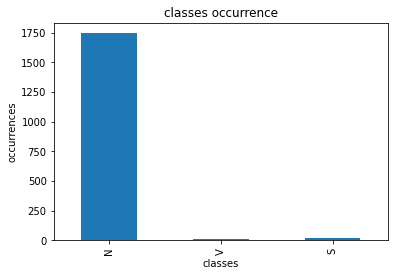

In [ ]:
#Data Analysis
import pandas as pd
from collections import Counter
import matplotlib.pyplot as plt

patient = 3

labels = ann_files[patient]['labels']

# putting labels in a list for managing reasons 
labels_adapt = list()
for label_temp in labels:
  labels_adapt.append(label_temp)

#plotting classes occurrencies for patient S002's labels
label_counts = Counter(labels_adapt)
df = pd.DataFrame.from_dict(label_counts, orient='index')
df.plot(kind='bar', legend=False, title='classes occurrence', xlabel='classes', ylabel='occurrences')
plt.show()

## 1.2 Plot of ECGs' length distribution

Counter({1800.0: 105})

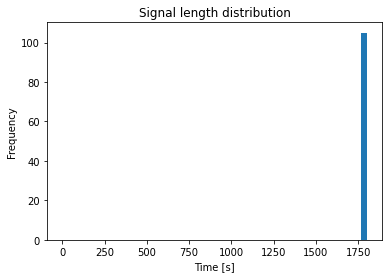

In [ ]:
"Plot ecg length distribution"
# list for storing different recording lenghts
length_recordings = list()

# Iterate through the different signals stored in "recordings": store signal length
# and divide by sampling frequency to obtain it in senconds
for i,rec_temp in enumerate(ecg_files):
  length_recordings.append(len(rec_temp['ecg'][:,0])/int(flag_fs[i]))

# Transform to pandas series and plot the histogram
length_rec_s = pd.Series(length_recordings)
ax = length_rec_s.plot.hist(bins=50, alpha=1, range=[0,1800])
ax.set_xlabel("Time [s]")
ax.set_title("Signal length distribution")
display(Counter(length_rec_s)) 
#as shown in the plot, every signal has the same length

## 1.3 **plot_ecg** functions

In [ ]:
# function to plot ECG
import matplotlib
"Plot a signal"
def plot_ecg(patient, lead, peaks_file, start_interval=0, end_interval=10, missed_peaks = []):
  '''
  plot the ecg of "patient" from "start_interval" to "end_interval"
  - start_interval and end_interval are in seconds

  - peaks_file is a file containing the peaks indexes


  '''
  
  
  fs=int(flag_fs[patient])

  signal_temp = ecg_files[patient]['ecg']
  t = np.arange(0, signal_temp.shape[0]/fs, 1/fs) 
  labels = np.array(ann_files[patient]['labels'])

  if peaks_file[-1] >= signal_temp.shape[0]: #do not consider peaks beyond the lenght of the signal
    peaks_file = peaks_file[:-1]
    labels = labels[:-1]



  idx_to_plot = (t > start_interval) & (t<end_interval)
  peaks_to_plot = (t[peaks_file] >start_interval) & (t[peaks_file] <end_interval)

  
  

  for peak in missed_peaks:
    l = rpk_files[patient]['rpeaks'] != peak
    labels = labels[[val for sublist in l for val in sublist]]
    print("Peak deleted at second " + str(1800 /signal_temp.shape[0]*peak))


  labels = labels[[val for sublist in peaks_to_plot for val in sublist]]
  #gather only the labels of the peaks that will be plotted

  rpeaks_idx = peaks_file[peaks_to_plot]

  fig, axs = plt.subplots(figsize = (20,4))
  axs.set_title("Patient:" + str(ids[patient]) + ", Lead:" +str(lead))


  axs.plot(t[idx_to_plot], signal_temp[idx_to_plot,lead], color='C0') 
  axs.plot(t[rpeaks_idx], signal_temp[rpeaks_idx,lead], color='red', marker='o', label = 'N')

  axs.scatter(t[rpeaks_idx[labels == 'V']], signal_temp[rpeaks_idx[labels == 'V'],lead], color='green', marker='^', label = 'V', s = 200)
  axs.scatter(t[rpeaks_idx[labels == 'S']], signal_temp[rpeaks_idx[labels == 'S'],lead], color='purple', marker='^', label = 'S', s = 200)

  axs.legend()
  axs.set_ylabel("Amplitude")

def plot_ecg2(signal_temp, labels, fs, peaks_file, start_interval=0, end_interval=10, missed_peaks = []):
  '''
  plot the ecg in "signal_temp" from "start_interval" to "end_interval"
  - fs is the signal sampling frequency

  - start_interval and end_interval are in seconds

  - peaks_file is a file containing the peaks indexes, if the adjusted peaks are passed you may need to pass also "missed_peaks"

  '''


  t = np.arange(0, signal_temp.shape[0]/fs, 1/fs) 

  if peaks_file[-1] >= signal_temp.shape[0]: #do not consider peaks beyond the lenght of the signal
    peaks_file = peaks_file[:-1]
    labels = labels[:-1]



  idx_to_plot = (t > start_interval) & (t<end_interval)
  peaks_to_plot = (t[peaks_file] >start_interval) & (t[peaks_file] <end_interval)
  labels = labels[[val for sublist in peaks_to_plot for val in sublist]]
  

  rpeaks_idx = peaks_file[peaks_to_plot]

  fig, axs = plt.subplots(figsize = (20,4))

  axs.plot(t[idx_to_plot], signal_temp[idx_to_plot], color='C0') 
  axs.plot(t[rpeaks_idx], signal_temp[rpeaks_idx], color='red', marker='o', label = 'N')

  axs.scatter(t[rpeaks_idx[labels == 'V']], signal_temp[rpeaks_idx[labels == 'V']], color='green', marker='^', label = 'V', s = 200)
  axs.scatter(t[rpeaks_idx[labels == 'S']], signal_temp[rpeaks_idx[labels == 'S']], color='purple', marker='^', label = 'S', s = 200)
  axs.set_title("ECG PORTION")
  axs.legend()
  axs.set_ylabel("Amplitude")


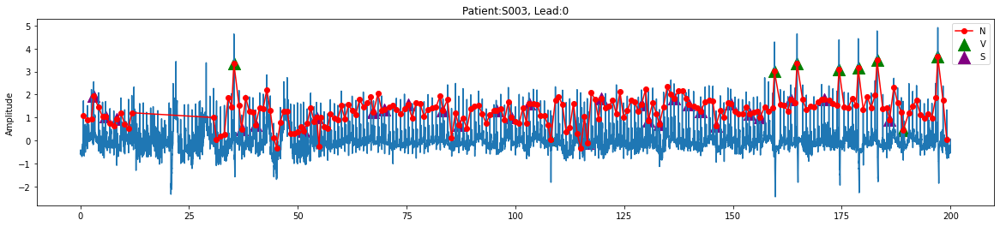

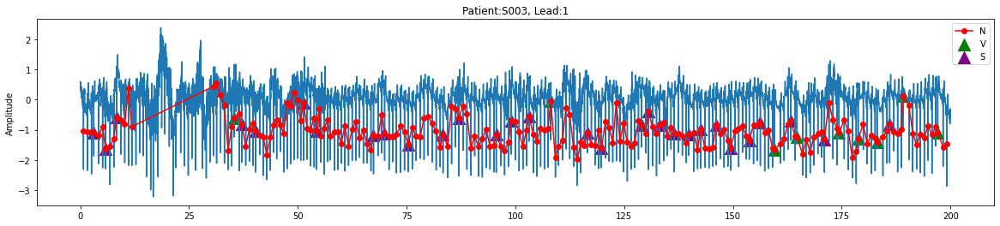

In [ ]:
#plot of a portion of ecg of patient S104 (both lead 0 and 1)
#you can try what patient you want changing these parameters:
patient = 2 #patient is a number in range(105)
#the followings should stay in the range 0 - 1800 seconds
start = 0 
stop = 200


plot_ecg(patient,0,  rpk_files[patient]['rpeaks'], start, stop)
plot_ecg(patient,1, rpk_files[patient]['rpeaks'],  start, stop)


Conclusions extracted from the visualization:

- Unbalanced dataset (N occurrences are way more than S and V ones)

- The database contains signals with equal lenghts 

- R-peaks labeling is extremely inaccurate

## 1.4 Feature extraction 

In [ ]:
def getInfo(index):
  '''
  Input: index from 0 to 104
  Output: 1x2 array with id and fs of the "index"-th observation of the dataset
  '''
  id = ids[index]
  fs = flag_fs[index]
  info = np.hstack([id, fs])
  return info

In [ ]:
#extract IDs and fs data from the header files through getInfo function 
num_files = 105
features = list()
header_data = list()
for i in range(num_files):
    header_data_temp = getInfo(i)
    header_data.append(header_data_temp)

#transform the lists into a pandas dataframe
#for better visualization and data handling 
header_data = pd.DataFrame(header_data, columns =['ID', 'fs'])


In [ ]:
from scipy import stats


def ecg_feature_extractor(ecg, peaks_file, fs, lead =0):
  "The function extracts the features from a peaks_file"
  
  #idx stores R-peaks indexes
  idx = peaks_file

  if idx[-1] >=  ecg.shape[0]:
    idx = idx[:-1]

  idx_diff = np.diff(idx , axis=0)
  idx_diff = idx_diff / int(fs)


  #number of beats: number of R peaks registered in the ecg. 
  #It is assumed to be the real number of heartbeats during the measurement
  n_beats = idx.shape[0]

  #mean
  mean_RR = np.mean(idx_diff)                #average distance between peaks
  mean_peaks = np.mean(ecg[idx,lead])        #average peaks amplitude
  #variance
  var_RR = stats.tvar(idx_diff)              #variance of peaks distance
  var_peaks = stats.tvar(ecg[idx,lead])      #variance of peaks amplitude

  #minimum distance between two peaks
  min_RR = min(idx_diff)

  #median
  median_RR = np.median(idx_diff)            #median of the distance between peaks
  median_Peaks = np.median(ecg[idx,lead])    #median of peaks amplitude

  #Skewness
  skew_RR = stats.skew(idx_diff)             #skewness of the distance between peaks
  skew_Peaks = stats.skew(ecg[idx,lead])     #skewness of peaks amplitude

  #Kurtosis
  kurt_RR = stats.kurtosis(idx_diff)         #kurtosis of the distance between peaks
  kurt_Peaks = stats.kurtosis(ecg[idx,lead]) #kurtosis of peaks amplitude

  features = np.hstack([mean_RR,mean_peaks,median_RR,median_Peaks, var_RR, var_peaks,
                        skew_RR,skew_Peaks,kurt_RR,kurt_Peaks, min_RR, n_beats])
  

  return features



In [ ]:
features_rhythm = list()  #list for storing features extracted
num_files = 105
#extract features from each ecg lead 0
for i in range(num_files):
  ecg = ecg_files[i]['ecg']
  fs = int(flag_fs[i])
  tmp = ecg_feature_extractor(ecg, rpk_files[i]["rpeaks"], fs,0)
  features_rhythm.append(tmp)

features_rhythm = np.array(features_rhythm)
features_rhythm = pd.DataFrame(features_rhythm, columns =['mean_RR', 'mean_peaks', 'median_RR', 'median_Peaks',
                                                          'var_RR', 'var_peaks','skew_RR', 'skew_Peaks',
                                                          'kurt_RR', 'kurt_Peaks','min_RR',  'n_beats'])


features_lead0 = pd.concat([header_data, features_rhythm], axis=1)

In [ ]:
#highlighting patients with variance of the distance between peaks over 1000
features_lead0[features_lead0.var_RR>1000] 

,ID,fs,mean_RR,mean_peaks,median_RR,median_Peaks,var_RR,var_peaks,skew_RR,skew_Peaks,kurt_RR,kurt_Peaks,min_RR,n_beats
92,S106,250,3.049383,1.060457,0.68,1.04,3284.358555,0.383053,24.228085,0.225348,585.000639,-0.534789,0.6,591.0


In [ ]:
#highlighting patients with n_beats less than 1700
features_lead0[features_lead0.n_beats<1700] 

,ID,fs,mean_RR,mean_peaks,median_RR,median_Peaks,var_RR,var_peaks,skew_RR,skew_Peaks,kurt_RR,kurt_Peaks,min_RR,n_beats
14,S015,128,1.069055,1.842844,1.070312,1.840,0.002500,0.072234,-0.026191,0.597607,12.110527,2.780877,0.679688,1684.0
21,S022,128,1.071298,0.416136,1.078125,0.405,0.004267,0.086256,-3.084164,0.401884,16.783382,1.229830,0.531250,1681.0
27,S028,128,1.077269,-0.429844,1.046875,-0.400,0.026037,0.250276,0.223804,-1.394413,1.189222,4.563849,0.398438,1671.0
92,S106,250,3.049383,1.060457,0.680000,1.040,3284.358555,0.383053,24.228085,0.225348,585.000639,-0.534789,0.600000,591.0


Conclusions extracted from the data analysis:

- Some of the ecgs have an high variance of the distance between R peaks.
- Drawing the ecgs of these patient we discover that they are flat for most of the time. 
- We probably have to implement a feature extractor or an outlier detector to exclude these parts of the ecgs

## 1.5 Plots to analyze the features

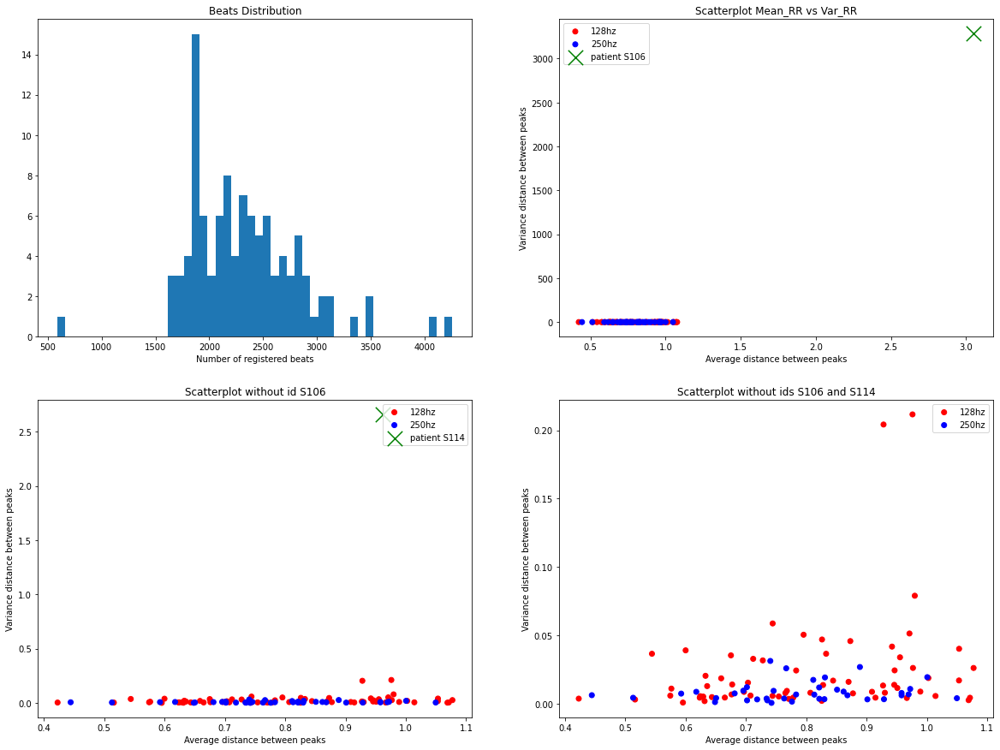

In [ ]:
from matplotlib import markers
from matplotlib.markers import MarkerStyle

fig, ax = plt.subplots(nrows = 2, ncols = 2,  figsize = (20,15))

#n_beats histogram
ax[0,0].hist(features_lead0.n_beats, bins=50, alpha=1)
ax[0,0].set_xlabel("Number of registered beats")
ax[0,0].set_title("Beats Distribution")


#scatterplot 
mask = np.zeros(105,dtype=bool)
mask[92] = 1
plot_list = np.ones(105, dtype=bool) #plotting every patient

colours = np.empty(105, dtype=object)
colours[features_lead0.fs == '128'] = 'red'
colours[features_lead0.fs == '250'] = 'blue'
colours[mask] = 'white' #coloring patient with ID 92 differently from the others as he's an outlier

ax[0,1].scatter(features_lead0.mean_RR[colours=='red'], features_lead0.var_RR[colours=='red'], color = colours[colours=='red'], label='128hz')#prima plotto i rossi
ax[0,1].scatter(features_lead0.mean_RR[colours!='red'], features_lead0.var_RR[colours!='red'], color = colours[colours!='red'], label='250hz')#poi i blu e i bianchi
ax[0,1].set_ylabel("Variance distance between peaks")
ax[0,1].set_xlabel("Average distance between peaks")
ax[0,1].set_title("Scatterplot Mean_RR vs Var_RR")
ax[0,1].scatter(features_lead0.mean_RR[92], features_lead0.var_RR[92], marker = 'x', color = 'green', s=300, label="patient " + str(ids[92]))
ax[0,1].legend()

#zoomed scatterplot without ID 92
plot_list[92] = 0 #not plotting patient with ID 92

mask[100] = 1
#coloring patient with ID 100 differently from the others
#as he's an outlier
colours[mask] = 'white'  


ax[1,0].scatter(features_lead0.mean_RR[plot_list & (colours=='red')], features_lead0.var_RR[plot_list & (colours=='red')], color = colours[plot_list & (colours=='red')], label = '128hz')# prima plotto i rossi
ax[1,0].scatter(features_lead0.mean_RR[plot_list & (colours!='red')], features_lead0.var_RR[plot_list & (colours!='red')], color = colours[plot_list & (colours!='red')], label = '250hz')# prima plotto i rossi
ax[1,0].set_xlabel("Average distance between peaks")
ax[1,0].set_ylabel("Variance distance between peaks")
ax[1,0].set_title("Scatterplot without id " + str(ids[92]))

ax[1,0].scatter(features_lead0.mean_RR[100], features_lead0.var_RR[100], marker = 'x', color = 'green', s=300, label="patient " + str(ids[100]))
ax[1,0].legend()

#zoomed scatterplot
plot_list[100] = 0

ax[1,1].scatter(features_lead0.mean_RR[plot_list & (colours=='red')], features_lead0.var_RR[plot_list & (colours=='red')], color = colours[plot_list & (colours=='red')], label = '128hz')
ax[1,1].scatter(features_lead0.mean_RR[plot_list & (colours!='red')], features_lead0.var_RR[plot_list & (colours!='red')], color = colours[plot_list & (colours!='red')], label ='250hz')

ax[1,1].set_xlabel("Average distance between peaks")
ax[1,1].set_ylabel("Variance distance between peaks")
ax[1,1].set_title("Scatterplot without ids " + str(ids[92]) + " and " + str(ids[100]))
ax[1,1].legend()


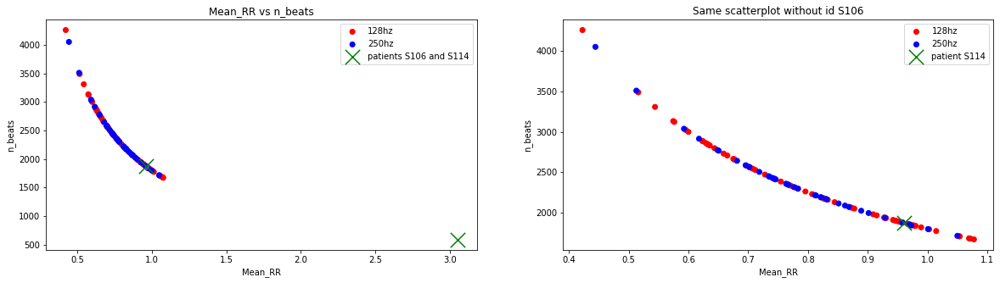

In [ ]:
#scatterplot to see correlation between n_beats and mean_RR

fig, ax = plt.subplots(nrows=1, ncols=2, figsize = (20,5))


ax[0].scatter(features_lead0.mean_RR[colours=='red'], features_lead0.n_beats[colours=='red'], color=colours[colours=='red'], label ="128hz")
ax[0].scatter(features_lead0.mean_RR[colours!='red'], features_lead0.n_beats[colours!='red'], color=colours[colours!='red'], label ="250hz")
ax[0].scatter(features_lead0.mean_RR[mask], features_lead0.n_beats[mask], color = 'green', marker = 'x', s = 300, label ="patients " + str(ids[92]) + " and " + str(ids[100]))
ax[0].set_xlabel("Mean_RR")
ax[0].set_ylabel("n_beats")
ax[0].set_title("Mean_RR vs n_beats")
ax[0].legend()

#Same scatterplot without id 92

ax[1].scatter(features_lead0.mean_RR[(colours=='red') & plot_list], features_lead0.n_beats[(colours=='red') & plot_list], color=colours[(colours=='red') & plot_list], label ="128hz")
ax[1].scatter(features_lead0.mean_RR[(colours!='red') & plot_list], features_lead0.n_beats[(colours!='red') & plot_list], color=colours[(colours!='red') & plot_list], label ="250hz")
ax[1].scatter(features_lead0.mean_RR[100], features_lead0.n_beats[100], color = 'green', marker = 'x', s = 300, label = "patient " +str(ids[100]))
ax[1].set_xlabel("Mean_RR")
ax[1].set_ylabel("n_beats")
ax[1].set_title("Same scatterplot without id " + str(ids[92]))
ax[1].legend()

## 1.6 Conclusions
The scatterplot shows that there are at least 2 outliers in terms of variance of the distance between R peaks (patient S106 and patient S114).<br>

There is also a clear dependence between Mean_RR and n_beats as expected.


# 2) **R-peaks repositioning**


In [ ]:
def max_R_peak(window_dim, idx, ecg):
  '''
  Inputs: 
  patient
  window_dim --> dimension of the window among which we compute each adjustment
  Output:
  index of the maximum "near" the original R-peak
  '''
  #idx stores R-peaks indexes
  ecg_len = ecg.shape[0]
  ecg_lead0 = ecg[:,0] 
  ecg_lead1 = ecg[:,1] 
  missed_beats0 = list()
  missed_beats1 = list()

  if idx[-1] >= ecg_len:#looking at the last peak
    missed_beats0.append(idx[-1])
    missed_beats1.append(idx[-1])
    idx = idx[:-1] #removing peaks over ecg's dimension


  #lists storing repositioned peaks for leads 0 and 1 respectively
  peaks_adjusted0 = list()
  peaks_adjusted1 = list()



  for i in idx:
    counter = i - window_dim 
    #counter stores the index of the ecg vector that corresponds to the first element of vector tmp   
    i = int(i)
    tmp_beat0 = ecg_lead0[i-window_dim:i+window_dim]
    tmp_beat1 = ecg_lead1[i-window_dim:i+window_dim]  
    
    
    if i-window_dim<0:
      counter = 0
      tmp_beat0 = ecg_lead0[:i+window_dim]
      tmp_beat1 = ecg_lead1[:i+window_dim]

    if i + window_dim>ecg_len:
      #counter = i - window_dim 
      tmp_beat0 = ecg_lead0[i-window_dim:]
      tmp_beat1 = ecg_lead1[i-window_dim:]   



    if counter + np.argmax(tmp_beat0) not in peaks_adjusted0[-window_dim:]:
      peaks_adjusted0.append([int(counter + np.argmax(tmp_beat0))]) #adding the peak if it wasn't in the list yet
    else:
      missed_beats0.append(i)

    if counter + np.argmax(tmp_beat1) not in peaks_adjusted1[-window_dim:]:
      peaks_adjusted1.append([int(counter + np.argmax(tmp_beat1))]) #adding the peak if it wasn't in the list yet
    else:
      missed_beats1.append(i)

  return peaks_adjusted0, peaks_adjusted1, missed_beats0, missed_beats1

In [ ]:
import time 
t0 = time.time() #stores starting time


adjusted_rpk = list()

missed_beats = [None] *105 #list for storing the indexes of peaks that were removed by the function for peaks repositioning 

for patient in tqdm(range(105)):
  fs = int(flag_fs[patient])
  #compute for each patient the minimum distance between two peaks and take as window_dim a smaller number
  #print("Adjusting patient " + str(patient+1) + '/' + str(num_files))
  ecg = ecg_files[patient]['ecg']
  window_dim = int(features_lead0.mean_RR[patient] * fs/6) #rule of thumb for deciding the window size
  
  #calling max_R_peak function for the repositioning
  adjusted_rpk_tmp0, adjusted_rpk_tmp1, missed_beats0_tmp, missed_beats1_tmp = max_R_peak(window_dim, rpk_files[patient]['rpeaks'], ecg)


  
  adjusted_rpk_tmp0 = np.array(adjusted_rpk_tmp0, dtype = int)
  adjusted_rpk_tmp1 = np.array(adjusted_rpk_tmp1, dtype = int)
  
  adjusted_rpk.append([adjusted_rpk_tmp0, adjusted_rpk_tmp1])
  missed_beats[patient]=[missed_beats0_tmp, missed_beats1_tmp]

time_taken = time.time() - t0 #computing the execution time of this cell
print("Time taken: " + str("{:.2f}".format(time_taken)) + " seconds")


  0%|          | 0/105 [00:00<?, ?it/s]

Time taken: 32.01 seconds


Create a list with the adjusted labels:

In [ ]:
#if the beat belongs to the missed_beats list then we also need to remove its label
missed_beats_patient = list()
for i in range(105):
  missed_beats_patient.append(missed_beats[i] != [[],[]])

idx = np.arange(0,105)

#adjusted labels are the labels that do not consider the missed beats
adjusted_labels = [ann_files[patient]['labels'] for patient in range(105)]

for i in idx[missed_beats_patient]: #considering only the indexes of patients who got peaks removed
  for peak in (missed_beats[i][0]):
    #In general we discovered that when a peak is missing, it is missing for both leads,
    #so we just check lead 0
    l = rpk_files[i]['rpeaks'] != peak
    adjusted_labels[i] = adjusted_labels[i][[val for sublist in l for val in sublist]]

Patients who got peaks removed:
- patient S002: peak near second 38
- patient S017: peak between seconds 176 and 177 
- patient S023: peak between seconds 327 and 329 
- patient S030: peak between seconds 59 and 61

## 2.1 Analysis of the results of the repositioning algorithm

Peak deleted at second 38.609375


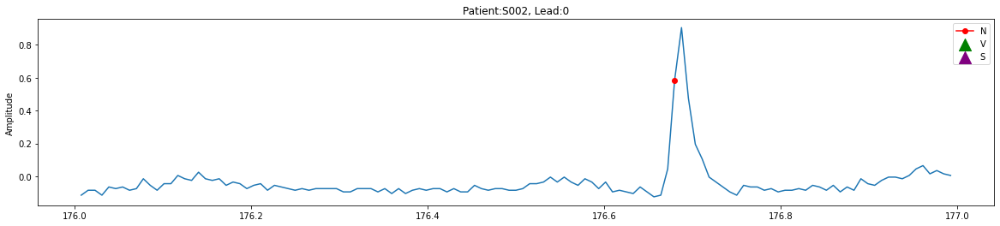

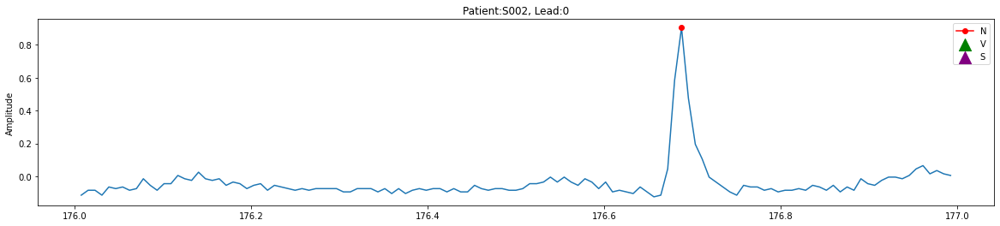

In [ ]:
#you can try to insert the values of the previous patients in order to see the results:
#patient 1 has a missed beat near second 38
#patient 16 has a missed beat near seconds 176 and 177, difficolut to see 
#patient 22 has a missed beat near seconds 327 and 329
#patient 29 has a missed beat near seconds 59 and 61


#plot the patient ecg from seconds "start" to "stop" and compare the R peaks labeling
#before and after repositioning

patient = 1


lead = 0
start = 176
stop = 177

given_peaks = rpk_files[patient]['rpeaks']
adjusted_peaks = adjusted_rpk[patient][lead]
missed_peaks = missed_beats[patient][lead]

plot_ecg(patient,lead, given_peaks, start,stop) #ecg with given peaks
plot_ecg(patient,lead, adjusted_peaks,start,stop, missed_peaks)#ecg with adjusted peaks

The repositioning seems to be accurate. <br>
The only issue is that when 2 peaks are too close the algorithm **always** discards the second one. The same happens for the labels. <br> 
Discarding always the second label is probably not right but since it happens only 4 times for the entire dataset it is not a problem.

## 2.2 Feature extraction from the adjusted peaks 

In [ ]:
adjusted_features = list()
lead = 0
num_files = 105
#using ecg_feature_extractor(ecg, peaks_file, fs, lead =0) with the adjusted_peaks file
for i in range(num_files):
  fs = int(flag_fs[i])
  tmp = ecg_feature_extractor(ecg_files[i]['ecg'], adjusted_rpk[i][lead], fs, lead)
  adjusted_features.append(tmp)
adjusted_features = np.array(adjusted_features)
adjusted_features = pd.DataFrame(adjusted_features, columns = ['mean_RR', 'mean_peaks', 'median_RR', 'median_Peaks',
                                                          'var_RR', 'var_peaks','skew_RR', 'skew_Peaks',
                                                          'kurt_RR', 'kurt_Peaks','min_RR',  'n_beats'])

features = pd.concat([header_data, adjusted_features], axis=1)
np.sum(features.n_beats - features_lead0.n_beats !=0)
#there are only 4 patient with different number of beats

4

## 2.3 Plots to analyse the features

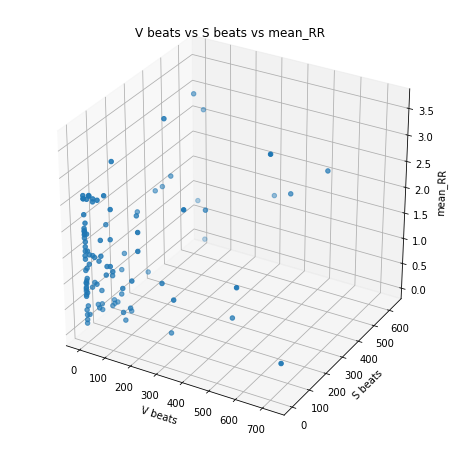

In [ ]:
from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure(figsize = (8,8))
ax = fig.add_subplot(111, projection='3d')
ax.set_xlabel("V beats")
ax.set_ylabel("S beats")
ax.set_zlabel("mean_RR")
ax.set_title("V beats vs S beats vs mean_RR")

v_counter = list()
s_counter = list()
for i in range(105):
  labels = ann_files[i]['labels']
  c = np.ones(labels.shape[0])
  v_counter.append(np.sum(c[labels == 'V']))
  s_counter.append(np.sum(c[labels == 'S']))


ax.scatter(v_counter, s_counter, features.mean_peaks)
#There seems to be no dependence between these variables


## 2.4 Classification through local features

  0%|          | 0/105 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:27: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


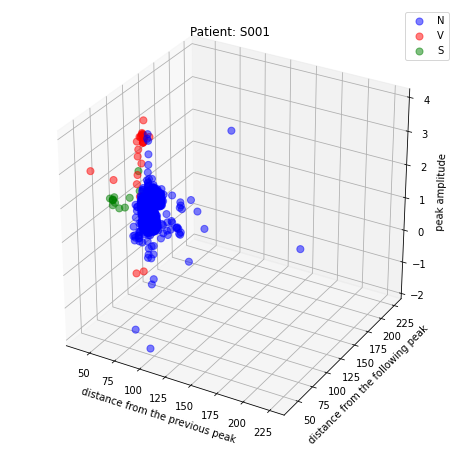

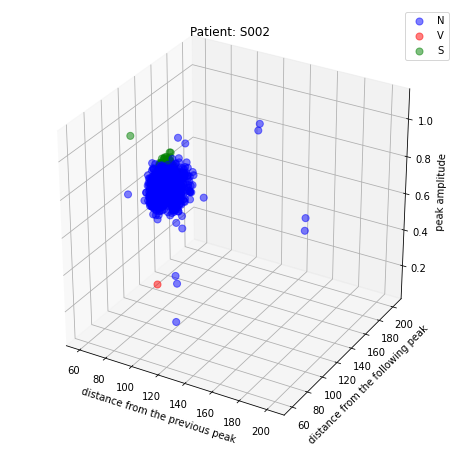

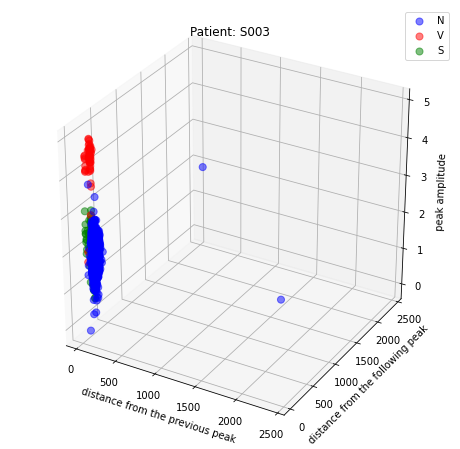

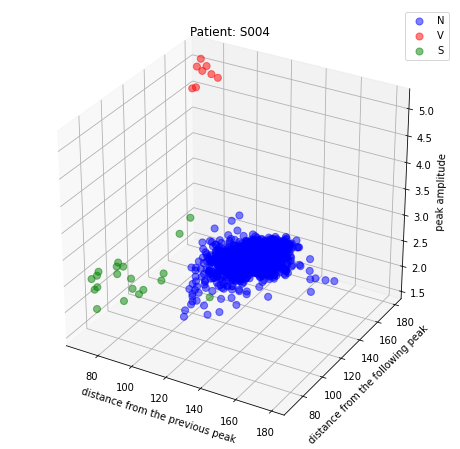

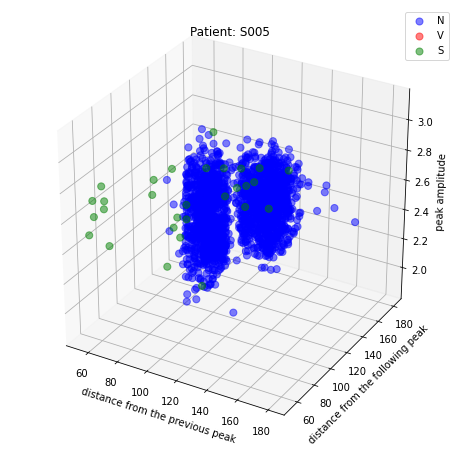

...

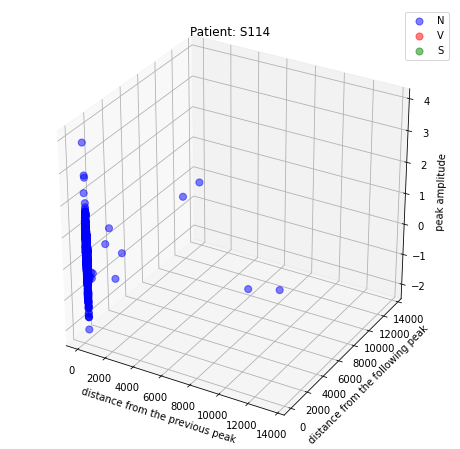

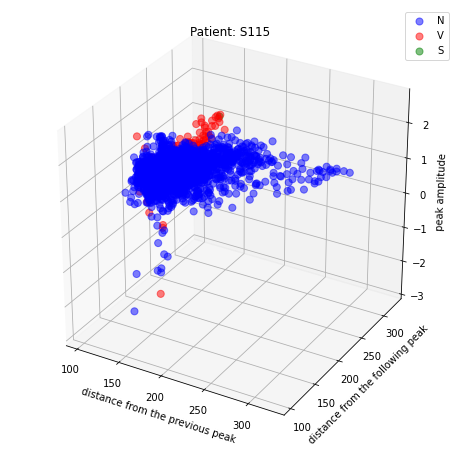

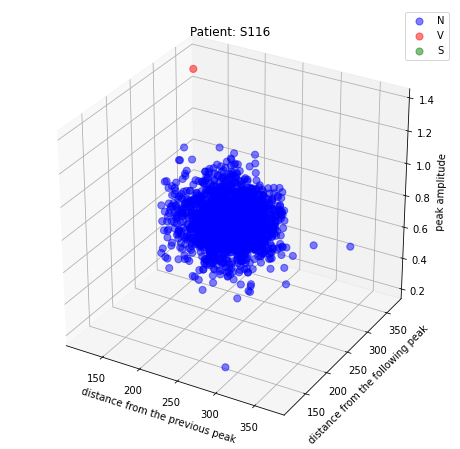

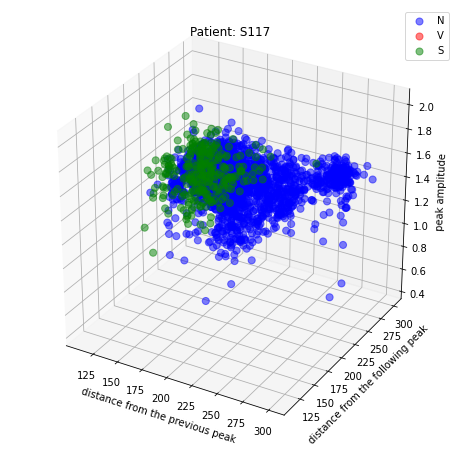

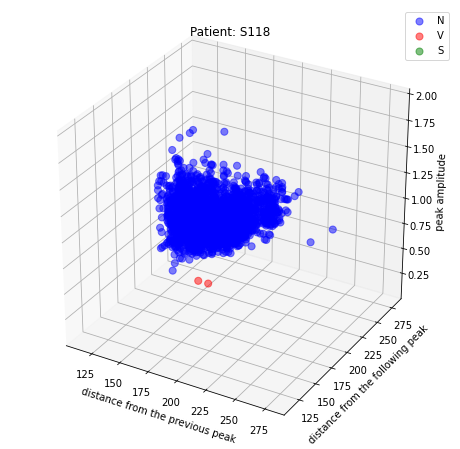

In [ ]:
# we call global features the features that we are given since the beginning (eg mean, median, skewness, ..)
# we want to create new features according to the attributes that we deem 
# important in order to clusterize heartbeats, for example the single hearthbeats amplitude and 
# the distance from the previous and the next beat.


lead = 0



for patient in tqdm(range(105)):
  idx = adjusted_rpk[patient][lead]
  labels = adjusted_labels[patient]

  #computing labels occurrences for each patient 
  N_points_idx = (labels == 'N')
  V_points_idx = (labels == 'V')
  S_points_idx = (labels == 'S')

  idx_diff_x = np.diff(idx[:-1], axis = 0) #out[i] = a[i+1] - a[i]
  # [0, 5, 3, 4]--> diff_x = [5,-2]
  idx_diff_y = np.diff(idx[1:], axis = 0) # out[i] = a[i] - a[i-1]
  # [0, 5, 3, 4]--> diff_y = [-2, 1]
  peaks_amplitude = ecg_files[patient]['ecg'][idx[1:-1],lead]

  #come si puo vedere dall'esempio in posizione 0 ho la distanza di 5 dal precedente sull'asse x e dal successivo sull'asse y
  fig = plt.figure(figsize = (8,8))
  ax = fig.add_subplot(111, projection='3d')
  ax.set_xlabel("distance from the previous peak")
  ax.set_ylabel("distance from the following peak")
  ax.set_zlabel("peak amplitude")
  ax.scatter(idx_diff_x[N_points_idx[1:-1]], idx_diff_y[N_points_idx[1:-1]], peaks_amplitude[N_points_idx[1:-1]], label ='N', color = 'blue', alpha = 0.5, s = 50)
  ax.scatter(idx_diff_x[V_points_idx[1:-1]], idx_diff_y[V_points_idx[1:-1]], peaks_amplitude[V_points_idx[1:-1]], label = 'V', color = 'red', alpha = 0.5, s = 50)
  ax.scatter(idx_diff_x[S_points_idx[1:-1]], idx_diff_y[S_points_idx[1:-1]], peaks_amplitude[S_points_idx[1:-1]], label = 'S', color = 'green', alpha = 0.5, s = 50)
  ax.set_title("Patient: " +str(ids[patient]))
  ax.legend()

The beats seem to form clusters for almost every patient if we consider the previous features. Maybe we can use a ML algorithm like knn to classify the R-peaks.

# 3) Filters

Since the ecgs contain some noise, it is better to filter them. <br>



In [ ]:
def bandpass_filter(data, lowcut, highcut, signal_freq, filter_order):
        """
        Method responsible for creating and applying Butterworth filter.
        :param deque data: raw data
        :param float lowcut: filter lowcut frequency value
        :param float highcut: filter highcut frequency value
        :param int signal_freq: signal frequency in samples per second (Hz)
        :param int filter_order: filter order
        :return array: filtered data
        """
        nyquist_freq = 0.5 * signal_freq
        low = lowcut / nyquist_freq
        high = highcut / nyquist_freq
        b, a = butter(filter_order, [low, high], btype="band")
        y = lfilter(b, a, data)
        return y

Rerun the code of point 1.4 but filtering the signals first

In [ ]:
adjusted_rpk_filtered = list()
missed_beats_filtered = [None] *105
ecg_filtered = list()


for patient in tqdm(range(105)):
  fs = int(flag_fs[patient])
  #compute for each patient the minimum distance between two peaks and take as window_dim a smaller number
  
  window_dim = int(features_lead0.mean_RR[patient] * fs/6) #rule of thumb for deciding the window size
  #creating the new ecg array per column
  ecg = bandpass_filter(ecg_files[patient]['ecg'],1, 40, fs, 3)
  ecg_filtered.append(ecg)
  

  adjusted_rpk_tmp0, adjusted_rpk_tmp1, missed_beats0_tmp, missed_beats1_tmp = max_R_peak(window_dim, rpk_files[patient]['rpeaks'], ecg) 
  #compute the adjustment
  
  adjusted_rpk_tmp0 = np.array(adjusted_rpk_tmp0, dtype = int)
  adjusted_rpk_tmp1 = np.array(adjusted_rpk_tmp1, dtype = int)

  adjusted_rpk_filtered.append([adjusted_rpk_tmp0, adjusted_rpk_tmp1])
  missed_beats_filtered[patient]=[missed_beats0_tmp, missed_beats1_tmp]

  0%|          | 0/105 [00:00<?, ?it/s]

In [ ]:
missed_beats_patient_filtered = list()
for i in range(105):
  missed_beats_patient_filtered.append(missed_beats[i] != [[],[]])

idx = np.arange(0,105)

adjusted_labels_filtered = [ann_files[patient]['labels'] for patient in range(105)]

for i in idx[missed_beats_patient]: 
  for peak in missed_beats_filtered[i][0]:
    l = rpk_files[i]['rpeaks'] != peak
    adjusted_labels_filtered[i] = adjusted_labels_filtered[i][[val for sublist in l for val in sublist]]

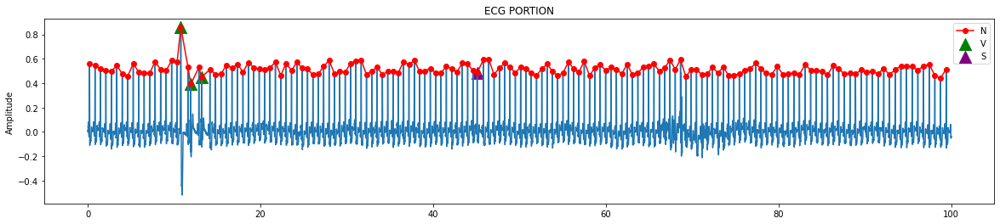

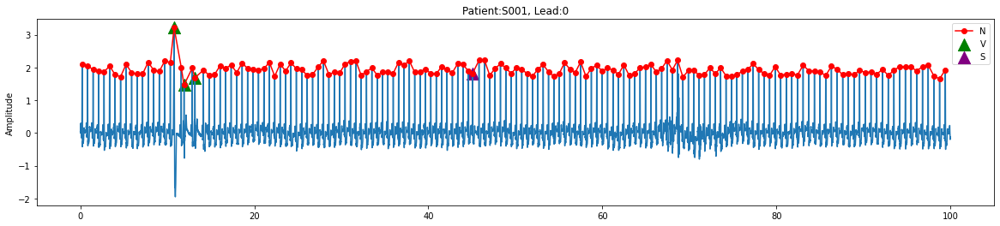

In [ ]:
patient = 0
ecg = ecg_files[patient]['ecg']
fs = int(flag_fs[patient])
missed = missed_beats[patient][0]
start = 0
stop = 100

filtered_ecg = bandpass_filter(ecg_files[patient]['ecg'], 1, 40, int(fs), 3)
labels = adjusted_labels_filtered[patient]
peaks = adjusted_rpk_filtered[patient][0]
#band-pass filter removes high and too low frequencies to remove background noise
plot_ecg2(filtered_ecg[:,0], labels, fs, peaks,start, stop) 
plot_ecg(patient,0,adjusted_rpk[patient][0], start, stop, missed)

#the first plot is the filtered ecg
#the second one is the normal ECG

The filter's effect is noticeable in the amplitude of the beats.

# 4) Hearthbeat extraction

## 4.1 Beats extractor

In [ ]:
def extract_beats(peak,ecg, window_dim):
  '''
  Given a peak, an ecg and a window_dim the function extracts the portion of the ecg around the peak
  from peak - window_dim to peak + window_dim.
  If the peak is too close to the beginning or the end of the ecg it extracts in the interval ":2 * window dim "
  or  "-2*window_dim :"
  The output contains the extracted ecg for both the leads
  '''
  #peak is the index of the R-peak of the current heartbeat
  
  ecg_len = ecg.shape[0]
  if (np.array(peak)<=window_dim).any():
    beat_lead0 = ecg[:2 * window_dim, 0]
    beat_lead1 = ecg[:2 * window_dim, 1]
    # we consider the interval ":2 * window_dim" such that it has the same size as the output heartbeat

    return [beat_lead0, beat_lead1]

  if (np.array(peak)>=ecg_len-window_dim).any():
    beat_lead0 = ecg[-2 * window_dim:, 0]
    beat_lead1 = ecg[-2 * window_dim:, 1]
    return [beat_lead0, beat_lead1]

  beat_lead0 = ecg[int(peak[0])-window_dim:int(peak[0])+window_dim, 0]
  beat_lead1 = ecg[int(peak[1])-window_dim:int(peak[1])+window_dim, 1]
  return [beat_lead0, beat_lead1]

  

We need to extract mean_RR from the filtered ecg so we use another time the function ecg_feature_extractor

In [ ]:
adjusted_features_filtered = list()
lead = 0
num_files = 105

for i in range(num_files):
  fs = int(flag_fs[i])
  tmp = ecg_feature_extractor(ecg_filtered[i], adjusted_rpk_filtered[i][lead], fs, lead)
  adjusted_features_filtered.append(tmp)
adjusted_features_filtered = np.array(adjusted_features_filtered)
adjusted_features_filtered = pd.DataFrame(adjusted_features_filtered, columns =['mean_RR', 'mean_peaks', 'median_RR', 'median_Peaks',
                                                          'var_RR', 'var_peaks','skew_RR', 'skew_Peaks',
                                                          'kurt_RR', 'kurt_Peaks','min_RR',  'n_beats'])
features_filtered = pd.concat([header_data, adjusted_features_filtered], axis=1)


In [ ]:
#we extract the heartbeats for every ECG
train_set = list()
t0 = time.time()
window_dim = 0

for i in range(105):
  fs = flag_fs[i]
  window_dim += features_filtered.mean_RR[i] * int(fs)

window_dim = int(window_dim) / 105 
#se set a window of fixed size
print (int(window_dim/3))
for patient in tqdm(range(105)):
  fs = flag_fs[patient]
  beats_list = list()

  for i in range(len(adjusted_rpk_filtered[patient][0])):

    peak = [int(adjusted_rpk_filtered[patient][0][i]), int(adjusted_rpk_filtered[patient][1][i])]
    # peak contains the peak index for the first and the second lead
    wd = int(window_dim/3)
    beat = extract_beats(peak, ecg_filtered[patient], wd)
    beats_list.append(beat)
    # beat is a list containing in each element of the list itself two portions of EGC
    # one portion for ech lead
    

  train_set.append(beats_list) 
    

print("Time taken: " + str(time.time() - t0))

48


  0%|          | 0/105 [00:00<?, ?it/s]

Time taken: 3.8074910640716553


## 4.2 plot_beat function

In [ ]:
def plot_beat(beat, fs):
  '''
  plot the beat, which is a portion of ecg
  '''
  t = np.arange(0, beat.shape[0]/fs, 1/fs)
  fig, axs = plt.subplots(figsize = (20,4))

  axs.plot(t, beat, color='C0', label = 'heartbeat') 
  axs.set_title("EXTRACTED BEAT")
  axs.legend()
  axs.set_ylabel("Amplitude")

## 4.3 Test the beats extractor: comparison between beats' plot and ecgs' plot

Patient id: S006
Beat number 2061 happens at second [1799.6171875]
Extracted beat: 


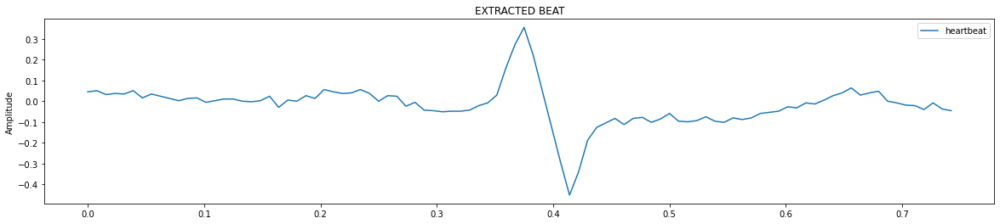

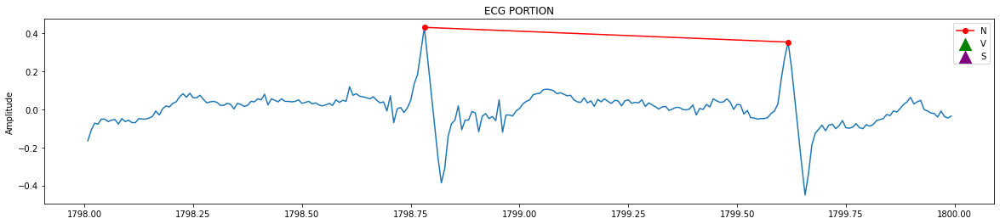

In [ ]:
patient = 5
beat = 2061
lead = 0
fs = int(flag_fs[patient])
peaks_file0 = adjusted_rpk_filtered[patient][lead]
peaks_file1 = adjusted_rpk_filtered[patient][lead + 1]
beat_time = adjusted_rpk_filtered[patient][lead][beat] * 1800 / ecg_files[patient]['ecg'].shape[0]
print("Patient id: " + str(ids[patient]))

print("Beat number "+ str(beat) + " happens at second "+str(beat_time))

start = np.floor(beat_time-1.01)
stop= np.ceil(beat_time+1.01)
missed_peaks0 = missed_beats[patient][lead]
missed_peaks1 = missed_beats[patient][lead + 1]

print("Extracted beat: ")
plot_beat(train_set[patient][beat][lead], fs)
plot_ecg2(ecg_filtered[patient][:,0], adjusted_labels_filtered[patient], fs, peaks_file0,start, stop) 

#the fist plot is the extracted beat
#the second is a larger portion of the ecg from which the beat is extracted

#5) Classification models

In [ ]:
#labels contains the one-hot encoded labels
import random
SEED = 1234
random.seed(SEED)
total_beats = 0

for i in range (105):
  total_beats += adjusted_labels_filtered[i].shape[0]
print("Total beats: " + str(total_beats))
labels = np.zeros(shape = (total_beats, 3), dtype = int)
temp = 0



for i in range(105):

  encoded_labels = np.zeros(shape=(adjusted_labels_filtered[i].shape[0], 3))
  encoded_labels[adjusted_labels_filtered[i] == 'V', 1] = 1
  encoded_labels[adjusted_labels_filtered[i] == 'S', 2] = 1

  labels[temp:temp + adjusted_labels_filtered[i].shape[0],:] = encoded_labels
  


  temp += adjusted_labels_filtered[i].shape[0]

print("N beats: " + str(np.sum(labels[:,0] == 0)))
print("V beats: " + str(np.sum(labels[:,1] == 1)))
print("S beats: " + str(np.sum(labels[:,2] == 1)))

Total beats: 244330
N beats: 244330
V beats: 7795
S beats: 9607


## 5.1 Classification Normal vs Abnormal beats

### 5.1.1 Feature extraction

In [ ]:
#this extract almost the same features wrt the first one
def ecg_feature_extractor2(ecg, peaks_file, fs, lead =0):
  "The function extract the features from a peaks_file"
  #idx contains the R peaks indices
  
  idx = peaks_file
  #
  if idx[-1] >=  ecg.shape[0]:
    idx = idx[:-1]

  idx_diff = np.diff(idx , axis=0)
  idx_diff = idx_diff / int(fs)

  #   mean
  mean_RR = np.mean(idx_diff)
  mean_peaks = np.mean(ecg[idx,lead])
  #   variance
  var_RR = stats.tvar(idx_diff)
  var_peaks = stats.tvar(ecg[idx,lead])

  #  minimum distance between two peaks
  min_RR = min(idx_diff)

  #   median
  median_RR = np.median(idx_diff)
  median_Peaks = np.median(ecg[idx,lead])

  #   Skewness
  skew_RR = stats.skew(idx_diff)
  skew_Peaks = stats.skew(ecg[idx,lead])

  #   Kurtosis
  kurt_RR = stats.kurtosis(idx_diff)
  kurt_Peaks = stats.kurtosis(ecg[idx,lead])

  features = np.hstack([mean_RR,mean_peaks,median_RR,median_Peaks, var_RR, var_peaks,
                        skew_RR,skew_Peaks,kurt_RR,kurt_Peaks, min_RR, float(fs/250)])

  return features



def diff_idx(ecg, peaks_file, fs):
  "The function extracts the vector of the idx differences from a peaks_file"
  #idx contains the R peaks indices
  
  idx = peaks_file
  
  if idx[-1] >=  ecg.shape[0]:
    idx = idx[:-1]

  idx_diff = np.diff(idx, axis=0)
  return idx_diff/fs

In [ ]:
#we extract the heartbeats for every ECG
beats_di_tutti = list()
labels_di_tutti = list()
features_di_tutti = list()

t0 = time.time()
window_dim = 0

for i in range(105):
  fs = flag_fs[i]
  window_dim += features_filtered.mean_RR[i] * int(fs)

window_dim = int(window_dim) / 105 #constant window dim for every patient
wd = int(window_dim/3)
print (wd)
for patient in tqdm(range(105)):
  fs = flag_fs[patient]

  ecg = ecg_filtered[patient]

  global_features = ecg_feature_extractor2(ecg, adjusted_rpk_filtered[patient][0], int(fs), lead =0)
  global_features2 = ecg_feature_extractor2(ecg, adjusted_rpk_filtered[patient][1], int(fs), lead =1)



  idx = diff_idx(ecg, adjusted_rpk_filtered[patient][0], int(fs)) #lead0
  idx_fixed = np.zeros(shape = (idx.shape[0] + 2)).reshape(-1,1)
  idx_fixed[0] = global_features[0]
  idx_fixed[-1] = global_features[0]
  idx_fixed[1:-1] = idx[:]

  idx2 = diff_idx(ecg, adjusted_rpk_filtered[patient][1], int(fs)) #lead1
  idx_fixed2 = np.zeros(shape = (idx2.shape[0] + 2)).reshape(-1,1)
  idx_fixed2[0] = global_features2[0]
  idx_fixed2[-1] = global_features2[0]
  idx_fixed2[1:-1] = idx2[:]

  beats_list = list()
  
  #window_dim = np.mean(features_filtered.mean_RR[np.array(flag_fs) == fs] * int(fs))
  # for every ECG we want to have the same window and the same length
  # in fact it's important that all the inputs of the network have the same dimension

  #we set the same window for each patient performing a weighted mean  

  for i in range(len(adjusted_rpk_filtered[patient][0])):
    if (patient != 92 & patient != 100): 
      #exclude the outliers from the dataset because they have very different global features
      labels_di_tutti.append(adjusted_labels_filtered[patient][i])
    
    peak = [int(adjusted_rpk_filtered[patient][0][i]), int(adjusted_rpk_filtered[patient][1][i])]
    # peak contains the peak index with respect to the first and second lead

    beat = extract_beats(peak, ecg, wd)
    beat = np.column_stack(beat)
    # beats is a list containing for each element "two portions of ECG"
    # one portion for each lead
    
    if (patient != 92 & patient != 100):
      beats_di_tutti.append(beat) 
      features_tot = list(global_features) #global features lead 0
      for j in global_features2:
        features_tot.append(j)             #global features lead 1
      
      features_tot.append(float(idx_fixed[i]))
      features_tot.append(float(idx_fixed[i+1]))

      features_tot.append(float(idx_fixed2[i]))
      features_tot.append(float(idx_fixed2[i+1]))

      features_tot.append(float(ecg[adjusted_rpk_filtered[patient][0][i],0]))
      features_tot.append(float(ecg[adjusted_rpk_filtered[patient][1][i],1]))
      

      min0 = min(beat[:,0])
      min1 = min(beat[:,1])
      diff0 = float(ecg[adjusted_rpk_filtered[patient][0][i],0]) - min0
      diff1 = float(ecg[adjusted_rpk_filtered[patient][1][i],1]) - min1

      # area underneath the curve standardized with the average value of the peaks of the patient(global_features[1])
      #it's computed for each lead
      area_under_the_curve0 = np.sum(abs(beat[:,0]) / int(fs) / abs(float(global_features[1])) )
      area_under_the_curve1 = np.sum(abs(beat[:,1]) / int(fs) / abs(float(global_features2[1])))

      features_tot.append(min0)
      features_tot.append(min1)
      features_tot.append(diff0)
      features_tot.append(diff1)
      features_tot.append(area_under_the_curve0)
      features_tot.append(area_under_the_curve1)




      features_di_tutti.append(features_tot)
    

print("Time taken: " + str(time.time() - t0))

48


  0%|          | 0/105 [00:00<?, ?it/s]

Time taken: 21.207041263580322


one hot encoded labels

In [ ]:
#convert the labels into one hot encoding

labels_encoded = list()
for i in tqdm(range(len(labels_di_tutti))):
  if (labels_di_tutti[i] == 'N'): labels_encoded.append([1., 0., 0.])
  if (labels_di_tutti[i] == 'V'): labels_encoded.append([0., 1., 0.])
  if (labels_di_tutti[i] == 'S'): labels_encoded.append([0., 0., 1.])

  0%|          | 0/208655 [00:00<?, ?it/s]

### 5.1.2 Creation of the training / validation /test set

In [ ]:
SEED = 1234
random.seed(SEED)
filenames = np.arange(0,len(features_di_tutti)) #i primi 64 son quelli con fs = 128
random.shuffle(filenames)

train_val_split= 0.8
train_features = features_di_tutti[:int (filenames.shape[0]*train_val_split)]
train_beats = beats_di_tutti[:int (filenames.shape[0]*train_val_split)]
train_labels = labels_encoded[:int (filenames.shape[0]*train_val_split)]
val_features = features_di_tutti[int(filenames.shape[0]*train_val_split):]
val_beats = beats_di_tutti[int(filenames.shape[0]*train_val_split):]
val_labels = labels_encoded[int(filenames.shape[0]*train_val_split):]

train_features = np.asarray(train_features)
train_beats = np.asarray(train_beats)
train_labels = np.asarray(train_labels)
val_features = np.asarray(val_features)
val_beats = np.asarray(val_beats)
val_labels = np.asarray(val_labels)

val_test_split = 0.4
dim = val_features.shape[0]
test_features = val_features[:int(dim*val_test_split)]
test_beats = val_beats[:int(dim*val_test_split)]
test_labels = val_labels[:int(dim*val_test_split)]
val_features = val_features[int(dim*val_test_split):]
val_beats = val_beats[int(dim*val_test_split):]
val_labels = val_labels[int(dim*val_test_split):]


In [ ]:
Ntrain = np.sum(train_labels[:,0])
Vtrain = np.sum(train_labels[:,1])
Strain = np.sum(train_labels[:,2])

Nval = np.sum(val_labels[:,0])
Vval = np.sum(val_labels[:,1])
Sval = np.sum(val_labels[:,2])

Ntest = int(np.sum(test_labels[:,0]))
Vtest = int(np.sum(test_labels[:,1]))
Stest = int(np.sum(test_labels[:,2]))

print("N samples train/val/test: " + str(Ntrain) + "/" + str(Nval) + "/" + str(Ntest))
print("V samples train/val/test: " + str(Vtrain) + "/" + str(Vval) + "/" + str(Vtest))
print("S samples train/val/test: " + str(Strain) + "/" + str(Sval) + "/" + str(Stest))


N samples train/val/test: 151276.0/24644.0/16676
V samples train/val/test: 6615.0/108.0/7
S samples train/val/test: 9033.0/287.0/9


### 5.1.3 Features' rescaling

The same transformation has to be applied on the whole dataset and on the test set we are going to receive after the submission

In [ ]:
# Robust scaler 
from sklearn.preprocessing import RobustScaler

transformer = RobustScaler().fit(train_features)
train_features= transformer.transform(train_features)
val_features = transformer.transform(val_features)
test_features = transformer.transform(test_features)


### 5.1.4 Resnet Blocks

In [ ]:
# ResNet model definition 


def ResBs_Conv(block_input, num_filters): 
   
    # 0. Filter Block input and BatchNormalization
    block_input = Conv1D(num_filters, kernel_size=7, strides = 2,  padding = 'same')(block_input) 
    block_input = BatchNormalization()(block_input)

    # 1. First Convolutional Layer
    conv1 = Conv1D(filters=num_filters, kernel_size=7, padding= 'same')(block_input)
    norm1 = BatchNormalization()(conv1)
    relu1 = Activation('relu')(norm1)  
    dropout = Dropout(0.2)(relu1)
    
    # 2. Second Convolutional Layer 
    conv2 = Conv1D(num_filters, kernel_size=7, padding= 'same')(dropout) #per avere concordanza
    norm2 = BatchNormalization()(conv2)

    # 3. Summing Layer (adding a residual connection)
    sum = Add()([block_input, norm2])
    
    # 4. Activation Layer
    relu2 = Activation('relu')(sum)
    
    return relu2 

def ResBs_Identity(block_input, num_filters): 

    # 1. First Convolutional Layer
    conv1 = Conv1D(filters=num_filters, kernel_size=7, padding= 'same')(block_input)
    norm1 = BatchNormalization()(conv1)
    relu1 = Activation('relu')(norm1)    
    dropout = Dropout(0.2)(relu1)
    
    # 2. Second Convolutional Layer 
    conv2 = Conv1D(num_filters, kernel_size=7, padding= 'same')(dropout) #per avere concordanza
    norm2 = BatchNormalization()(conv2)

    # 3. Summing Layer (adding a residual connection)
    sum = Add()([block_input, norm2])
    
    # 4. Activation Layer
    relu2 = Activation('relu')(sum)
    
    return relu2 


In [ ]:
# model integrating deep + wide 
# 

def resnet_deep_wide(N=6, ch=2, win_len=96, num_wide_features= 36, classes=3): 
    # A. Wide features
    wide_input = Input(shape= (num_wide_features, ), name = 'wide_features')
    wide_branch = Dense(14, activation='relu')(wide_input)

    # B. ECG window input of shape (batch_size,  WINDOW_LEN, CHANNELS)
    ecg_input = Input(shape=(win_len, ch), name='ecg_signal') 

    ResNet = Conv1D(filters=64,kernel_size=15, padding = 'same')(ecg_input) 
    ResNet = BatchNormalization()(ResNet)
    ResNet = Activation('relu')(ResNet)
    ResNet = MaxPooling1D(pool_size=2, strides = 2)(ResNet)
    
    # B.5 ResBs (x8) blocks
    # The number of filters starts from 64 and doubles every two blocks
    
    # First two ResNet blocks are identity blocks 
    ResNet = ResBs_Identity(ResNet, 64)
    ResNet = ResBs_Identity(ResNet, 64)

    filters = 64
    M= int((N -2 )/2)
    for i in range(M): 
        filters = filters*2

        # define N-th ResBs block
        ResNet = ResBs_Conv(ResNet, filters)
        ResNet = ResBs_Identity(ResNet, filters)
    
    ResNet = GlobalMaxPooling1D(name='gmp_layer')(ResNet)
    ResNet = Flatten()(ResNet)

    shared_path = concatenate([ResNet, wide_branch], name='concat_layer')
    shared_path = Dense(classes, activation='softmax', name='softmax_classifier')(shared_path)
   
    # Finally the model is composed by connecting inputs to outputs: 
    model = Model(inputs=[ecg_input,  wide_input],outputs=shared_path)

    return model

In [ ]:
resNet_deep_wide_model1 = resnet_deep_wide(N=5, ch=2, win_len=96,num_wide_features= 36, classes=2)

### 5.1.5 Fix the train / val / test set

In [ ]:
train_labels1 = np.zeros(shape = (train_labels.shape[0], 2))#N vs non N
val_labels1 = np.zeros(shape = (val_labels.shape[0], 2))#N vs non N
test_labels1 = np.zeros(shape = (test_labels.shape[0], 2))#N vs non N
for i in range(train_labels.shape[0]):
  if(train_labels[i,:] ==  [1., 0., 0.]).all() :
    train_labels1[i,:] = [1., 0.]
  else:
    train_labels1[i,:] = [0., 1.]

for i in range(val_labels.shape[0]):
  if(val_labels[i,:] ==  [1., 0., 0.]).all() :
    val_labels1[i,:] = [1., 0.]
  else:
    val_labels1[i,:] = [0., 1.]

for i in range(test_labels.shape[0]):
  if(test_labels[i,:] ==  [1., 0., 0.]).all() :
    test_labels1[i,:] = [1., 0.]
  else:
    test_labels1[i,:] = [0., 1.]

We are going to use a weighted loss since we have an extremely unbalanced dataset

In [ ]:
import tensorflow as tf
import tensorflow_addons as tfa
#weighted loss
def get_weighted_loss(pos_weights, neg_weights, epsilon=1e-7):
    def weighted_loss(y_true, y_pred):
        y_true = tf.cast(y_true, tf.float32)
        loss = 0.0
        
        for i in range(len(pos_weights)):
            loss += K.mean(-(pos_weights[i] *y_true[:,i] * K.log(y_pred[:,i] + epsilon) #we have to penalise 'V' and 'S'
                             + neg_weights[i]* (1 - y_true[:,i]) * K.log( 1 - y_pred[:,i] + epsilon))) 
        return loss    
    return weighted_loss

In [ ]:
#class frequency
pn = np.sum(train_labels1[:,0]) / train_labels1.shape[0]
pnonn = np.sum(train_labels1[:,1]) / train_labels1.shape[0]
neg_freq = [pn,pnonn] #
pos_freq = [(1 - pn), (1-pnonn)] #
print(neg_freq)

[0.9062567395940667, 0.09374326040593324]


In [ ]:
learning_rate = 0.001
resNet_deep_wide_model1.compile(
    optimizer = keras.optimizers.Adam(learning_rate),
    loss = get_weighted_loss(pos_freq, neg_freq),
    metrics = ['accuracy', 'Precision', 'Recall']
)

### 5.1.6 Generators

In [ ]:
# Definition of new data generators integrating wide features

# validation data generator
def generate_validation_data(ecg_filenames, feature_dict, y):
  ecg_filenames_val = ecg_filenames

  validation_set_signal = []

  for beat in ecg_filenames_val:
    filtered = beat
    validation_set_signal.append(filtered)
  
  return {'ecg_signal': np.array(validation_set_signal),
       'wide_features': np.array(feature_dict)},{'softmax_classifier': np.array(y, dtype=bool)}

def generate_test_data(ecg_filenames, feature_dict):
  ecg_filenames_val = ecg_filenames

  validation_set_signal = []

  for beat in ecg_filenames_val:
    filtered = beat
    validation_set_signal.append(filtered)
  
  return {'ecg_signal': np.array(validation_set_signal),
       'wide_features': np.array(feature_dict)}

# Batch generator for training data 
def batch_generator_data_f(batch_size, x_gen, f_gen,  y_gen):
  batch_features = np.zeros((batch_size,36))
  batch_signals = np.zeros((batch_size,96, 2)) 
  batch_labels = np.zeros((batch_size,2))    

  while True:
    for i in range(batch_size):
        batch_features[i] = next(f_gen)
        batch_signals[i] = next(x_gen)
        batch_labels[i] = next(y_gen)
     
    yield {'ecg_signal': np.array(batch_signals),
          'wide_features': np.array(batch_features)}, {'softmax_classifier': np.array(batch_labels, dtype=bool)}

        
def generate_y_shuffle(y):
    while True:
        for i in y:
            y_generated = i
            yield y_generated

def generate_X_shuffle(x):
    while True:
        for i in x:
          filtered = i
          yield filtered

def generate_F_shuffle(feature_dict):
    while True:
        for i in feature_dict:          
          yield  i 



Callbacks:

In [ ]:
import os
from datetime import datetime

cwd = os.getcwd()

exps_dir = "/content/drive/MyDrive/AI_in_Biomedicine/final assignment/experiments"
if not os.path.exists(exps_dir):
    os.makedirs(exps_dir)

now = datetime.now().strftime('%b%d_%H-%M-%S')

model_name = 'Resnet_wide_1'

exp_dir = os.path.join(exps_dir, model_name + '_' + str(now))
if not os.path.exists(exp_dir):
    os.makedirs(exp_dir)
    
callbacks = []

# Model checkpoint
# ----------------

ckpt_dir = os.path.join(exp_dir, 'ckpts')
if not os.path.exists(ckpt_dir):
    os.makedirs(ckpt_dir)

ckpt_callback = tf.keras.callbacks.ModelCheckpoint(filepath=os.path.join(ckpt_dir, 'cp_{epoch:02d}.ckpt'), 
                                                   save_weights_only=True)  # False to save the model directly
callbacks.append(ckpt_callback)

# Early Stopping
# --------------
early_stop = True
if early_stop:
    es_callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=10)
    callbacks.append(es_callback)

In [ ]:
validation = generate_validation_data(val_beats,val_features, val_labels1)

In [ ]:
# Train the ResNet with wide features using the modified batch generator 
batchsize = 128
resNet_deep_wide_model_train_1 = resNet_deep_wide_model1


### 5.1.7 Model fitting

In [ ]:
# history_resNet_deep_wide_train_1 = resNet_deep_wide_model_train_1.fit(
#     batch_generator_data_f(batch_size=batchsize, x_gen=generate_X_shuffle(train_beats),f_gen= generate_F_shuffle(train_features), y_gen=generate_y_shuffle(train_labels1)),
#     validation_data= validation,
#     steps_per_epoch=(len(train_beats)/batchsize),
#     batch_size = batchsize,
#     callbacks = callbacks,
#     epochs = 5).history


In [ ]:
# #plot performances
# history = history_resNet_deep_wide_train_1
# plt.figure(figsize = (12,4))
# plt.subplot(1,2,1)
# plt.plot(history['loss'], label="training loss")
# plt.plot(history['val_loss'], label="validation loss")
# plt.title('Lossfunction ResNet:')
# plt.legend()
# plt.subplot(1,2,2)
# plt.plot(history['accuracy'], label="training accuracy")
# plt.plot(history['val_accuracy'], label="validation accuracy")
# plt.title('Accuracy ResNet:')
# plt.legend()
# #plot performances
# plt.figure(figsize = (12,4))
# plt.subplot(1,2,1)
# plt.plot(history['precision'], label="training precision")
# plt.plot(history['val_precision'], label="validation precision")
# plt.title('Precision ResNet:')
# plt.legend()
# plt.subplot(1,2,2)
# plt.plot(history['recall'], label="training recall")
# plt.plot(history['val_recall'], label="validation recall")
# plt.title('Recall ResNet:')
# plt.legend()

Since the validation loss is minimized at the third checkpoint, we saved this one in particular.<br>
**Remark**: we decided to train only 5 epochs in order to save computational power.

In [ ]:
resNet_deep_wide_model_train_1.load_weights(r"/content/drive/MyDrive/AI_in_Biomedicine/final assignment/ckpts/model1.ckpt")
#load the check point of the first model
#best ckpt in terms of validation accuracy

In [ ]:
test_set = generate_test_data(test_beats,test_features)
y_pred = resNet_deep_wide_model_train_1.predict(test_set)

In [ ]:
predictions = y_pred
for i in range(predictions.shape[0]):
  M = np.argmax(predictions[i,:])
  predictions[i,:] = 0.
  predictions[i, M] = 1.

In [ ]:
def compute_modified_confusion_matrix(labels, outputs):
    # Compute a binary multi-class, multi-label confusion matrix, where the column
    # are the labels and the rows are the outputs.
    num_recordings, num_classes = np.shape(labels)
    A = np.zeros((num_classes, num_classes))

    # Iterate over all of the recordings.
    for i in range(num_recordings):
        # Iterate over all of the classes.
        for j in range(num_classes):
            # Assign credit for each positive class.
            if labels[i, j]: 
                for k in range(num_classes):
                    if outputs[i, k]:
                        A[k, j] += 1.0
    return A

### 5.1.8 Results

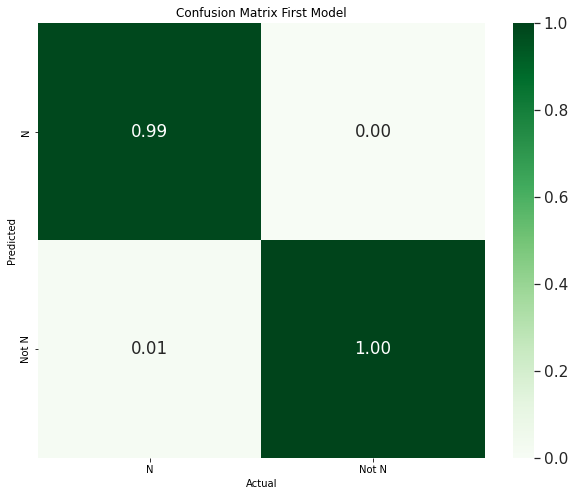

In [ ]:
df_cm = compute_modified_confusion_matrix(test_labels1, predictions)
df_cm  = df_cm / np.sum(df_cm, axis = 0)
df_cm
df_norm_col = pd.DataFrame(df_cm)
df_norm_col.columns = ['N', 'Not N']
df_norm_col.index = ['N', 'Not N']
df_norm_col.index.name = 'Predicted'
df_norm_col.columns.name = 'Actual'
plt.figure(figsize = (10,8))
plt.title("Confusion Matrix First Model")
sns.set(font_scale=1.4)
sns.heatmap(df_norm_col, cmap="Greens", annot=True,fmt='.2f')

the performances SEEM good. We must say that the model could be overfitted (even though we chose the ckpt with the lowest validation loss). Moreover, the samples of the training and test sets are not independent because there is a lot of collinearity between beats from the same patient.

## 5.2 Classification V vs S beats

In [ ]:
#convert the labels into one hot encoding
labels_encoded = list()
for i in tqdm(range(len(labels_di_tutti))):
  if (labels_di_tutti[i] == 'N'): labels_encoded.append([1., 0., 0.])
  if (labels_di_tutti[i] == 'V'): labels_encoded.append([0., 1., 0.])
  if (labels_di_tutti[i] == 'S'): labels_encoded.append([0., 0., 1.])

  0%|          | 0/208655 [00:00<?, ?it/s]

### 5.2.1 Fix the train / val / test set

In [ ]:
SEED = 1234
random.seed(SEED)

labels2 = list()
index_list = list()
for i in range(len(labels_encoded)):
  if (labels_encoded[i] == [0., 1., 0.]):
    index_list.append(i)
    labels2.append([1., 0.])
  if (labels_encoded[i] == [0., 0., 1.]):
    index_list.append(i)
    labels2.append([0., 1.])

filenames = np.arange(0, len(index_list))
random.shuffle(filenames)
features_di_tutti = np.asarray(features_di_tutti)
beats_di_tutti = np.asarray(beats_di_tutti)
labels2 = np.asarray(labels2)
index_list = np.asarray(filenames)
index_list = index_list[filenames]
labels2 = labels2[filenames]

train_val_split= 0.8

train_features2 = features_di_tutti[index_list[:int(train_val_split*len(index_list))]]
train_beats2 = beats_di_tutti[index_list[:int(train_val_split*len(index_list))]]
train_labels2 = labels2[:int(train_val_split*len(index_list))]
val_features2 = features_di_tutti[index_list[int(train_val_split*len(index_list)):]]
val_beats2 = beats_di_tutti[index_list[int(train_val_split*len(index_list)):]]
val_labels2 = labels2[int(train_val_split*len(index_list)):]

val_test_split = 0.4

dim = val_features2.shape[0]
test_features2 = val_features2[:int(dim*val_test_split)]
test_beats2 = val_beats2[:int(dim*val_test_split)]
test_labels2 = val_labels2[:int(dim*val_test_split)]
val_features2 = val_features2[int(dim*val_test_split):]
val_beats2 = val_beats2[int(dim*val_test_split):]
val_labels2 = val_labels2[int(dim*val_test_split):]


In [ ]:
Vtrain = np.sum(train_labels2[:,0])
Stest = np.sum(train_labels2[:,1])


Vval = np.sum(val_labels2[:,0])
Stest = np.sum(val_labels2[:,1])


Vtest = int(np.sum(test_labels2[:,0]))
Stest = int(np.sum(test_labels2[:,1]))


print("V samples train/val/test: " + str(Vtrain) + "/" + str(Vval) + "/" + str(Vtest))
print("S samples train/val/test: " + str(Strain) + "/" + str(Sval) + "/" + str(Stest))
#okok

V samples train/val/test: 5395.0/802.0/533
S samples train/val/test: 9033.0/287.0/751


### 5.2.2 Apply the same rescaling

In [ ]:
# we apply the same standardization of the previous network

# Robust scaler 
from sklearn.preprocessing import RobustScaler

train_features2= transformer.transform(train_features2)
val_features2 = transformer.transform(val_features2)
test_features2 = transformer.transform(test_features2)

In [ ]:
from keras.layers import Input, Add, multiply, Dense, Activation, ZeroPadding1D, Flatten, GlobalAveragePooling1D,  Conv1D, MaxPooling1D, GlobalMaxPooling1D, Dropout,concatenate, BatchNormalization, Reshape

# Squeeze and excitation module 
def se_block(in_block, ch, ratio=16):
    x = GlobalAveragePooling1D()(in_block)
    #flat = Reshape((1, num_filters))(se_pool1)
    x = Dense(ch//ratio, activation='relu')(x)
    x = Dense(ch, activation='sigmoid')(x)
    x = multiply([in_block, x])
    return x
    

In [ ]:
# ResNet with Squeeze and excitation block model definition 


def ResBs_SE_Conv(block_input, num_filters): 
   
    # 0. Filter Block input and BatchNormalization
    block_input = Conv1D(num_filters, kernel_size=7, strides = 2,  padding = 'same')(block_input) 
    block_input = BatchNormalization()(block_input)

    # 1. First Convolutional Layer
    conv1 = Conv1D(filters=num_filters, kernel_size=7, padding= 'same')(block_input)
    norm1 = BatchNormalization()(conv1)
    relu1 = Activation('relu')(norm1)  
    dropout = Dropout(0.05)(relu1)
    
    # 2. Second Convolutional Layer 
    conv2 = Conv1D(num_filters, kernel_size=7, padding= 'same')(dropout) #per avere concordanza
    norm2 = BatchNormalization()(conv2)

    # 3. SE block (fucntion defined above)
    se = se_block(norm2, ch=num_filters)

    # 4. Summing Layer (adding a residual connection)
    sum = Add()([block_input, se])
    
    # 5. Activation Layer
    relu2 = Activation('relu')(sum)
    
    return relu2 

def ResBs_SE_Identity(block_input, num_filters): 

    # 1. First Convolutional Layer
    conv1 = Conv1D(filters=num_filters, kernel_size=7, padding= 'same')(block_input)
    norm1 = BatchNormalization()(conv1)
    relu1 = Activation('relu')(norm1)    
    dropout = Dropout(0.05)(relu1)
    
    # 2. Second Convolutional Layer 
    conv2 = Conv1D(num_filters, kernel_size=7, padding= 'same')(dropout) #per avere concordanza
    norm2 = BatchNormalization()(conv2)

    # 3. SE block (fucntion defined above)
    se = se_block(norm2, ch=num_filters)
    
    # 4. Summing Layer (adding a residual connection)
    sum = Add()([block_input, se])
    
    # 5. Activation Layer
    relu2 = Activation('relu')(sum)
    
    return relu2 

# model integrating deep + wide 
def resnet_SE_deep_wide(N=8, ch=12, win_len=5000, num_wide_features= 36, classes=9): 
    # A. Wide features
    wide_input = Input(shape= (num_wide_features, ), name = 'wide_features')
    wide_branch = Dense(13, activation='relu')(wide_input)

    # B. ECG window input of shape (batch_size,  WINDOW_LEN, CHANNELS)
    ecg_input = Input(shape=(win_len, ch), name='ecg_signal') 

    ResNet = Conv1D(filters=64,kernel_size=15, padding = 'same')(ecg_input) 
    ResNet = BatchNormalization()(ResNet)
    ResNet = Activation('relu')(ResNet)
    ResNet = MaxPooling1D(pool_size=2, strides = 2)(ResNet)
    
    # B.5 ResBs (x8) blocks
    # The number of filters starts from 64 and doubles every two blocks
    
    # First two ResNet blocks are identity blocks 
    ResNet = ResBs_SE_Identity(ResNet, 64)
    ResNet = ResBs_SE_Identity(ResNet, 64)

    filters = 64
    M= int((N -2 )/2)
    for i in range(M): 
        filters = filters*2

        # define N-th ResBs block
        ResNet = ResBs_SE_Conv(ResNet, filters)
        ResNet = ResBs_SE_Identity(ResNet, filters)
    
    ResNet = GlobalMaxPooling1D(name='gmp_layer')(ResNet)
    ResNet = Flatten()(ResNet)

    shared_path = concatenate([ResNet, wide_branch], name='concat_layer')
    shared_path = Dense(classes, activation='softmax', name='softmax_classifier')(shared_path)
   
    # Finally the model is composed by connecting inputs to outputs: 
    model = Model(inputs=[ecg_input,  wide_input],outputs=shared_path)

    return model

In [ ]:
import os
from datetime import datetime

cwd = os.getcwd()

exps_dir = "/content/drive/MyDrive/AI_in_Biomedicine/final assignment/experiments"
if not os.path.exists(exps_dir):
    os.makedirs(exps_dir)

now = datetime.now().strftime('%b%d_%H-%M-%S')

model_name = 'Resnet_wide_2'

exp_dir = os.path.join(exps_dir, model_name + '_' + str(now))
if not os.path.exists(exp_dir):
    os.makedirs(exp_dir)
    
callbacks = []

# Model checkpoint
# ----------------

ckpt_dir = os.path.join(exp_dir, 'ckpts')
if not os.path.exists(ckpt_dir):
    os.makedirs(ckpt_dir)

ckpt_callback = tf.keras.callbacks.ModelCheckpoint(filepath=os.path.join(ckpt_dir, 'cp_{epoch:02d}.ckpt'), 
                                                   save_weights_only=True)  # False to save the model directly
callbacks.append(ckpt_callback)

# Early Stopping
# --------------
early_stop = True
if early_stop:
    es_callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=10)
    callbacks.append(es_callback)

The classes are not so unbalanced as before

In [ ]:
#class freq
pv = np.sum(train_labels2[:,0]) / train_labels2.shape[0]
ps = np.sum(train_labels2[:,1]) / train_labels2.shape[0]
neg_freq = [pv,ps] #
pos_freq = [(1 - pv), (1-ps)] #
print(neg_freq)


[0.41994239900365843, 0.5800576009963415]


In [ ]:
resnet_SE_deep_wide_model = resnet_SE_deep_wide(N=5, ch=2, win_len=96,num_wide_features= 36, classes=2)

learning_rate = 0.0005
resnet_SE_deep_wide_model.compile(
    optimizer = keras.optimizers.Adam(),
    loss = get_weighted_loss(pos_freq, neg_freq),
    metrics = ['accuracy', 'Precision', 'Recall']
)


validation = generate_validation_data(val_beats2,val_features2, val_labels2)


### 5.2.3 Model fitting

In [ ]:
# # Train the ResNet with wide features using the modified batch generator 
# batchsize = 128
resNet_deep_wide_model_train_2 = resnet_SE_deep_wide_model

# history_resNet_deep_wide_train_2 = resNet_deep_wide_model_train_2.fit(
#     batch_generator_data_f(batch_size=batchsize, x_gen=generate_X_shuffle(train_beats2),f_gen= generate_F_shuffle(train_features2), y_gen=generate_y_shuffle(train_labels2)),
#     validation_data= validation,
#     steps_per_epoch=(len(train_beats)/batchsize),
#     batch_size = batchsize,
#     callbacks = callbacks,
#     epochs = 5).history

In [ ]:
# #plot performances
# history = history_resNet_deep_wide_train_2
# plt.figure(figsize = (12,4))
# plt.subplot(1,2,1)
# plt.plot(history['loss'], label="training loss")
# plt.plot(history['val_loss'], label="validation loss")
# plt.title('Lossfunction ResNet:')
# plt.legend()
# plt.subplot(1,2,2)
# plt.plot(history['accuracy'], label="training accuracy")
# plt.plot(history['val_accuracy'], label="validation accuracy")
# plt.title('Accuracy ResNet:')
# plt.legend()
# #plot performances
# plt.figure(figsize = (12,4))
# plt.subplot(1,2,1)
# plt.plot(history['precision'], label="training precision")
# plt.plot(history['val_precision'], label="validation precision")
# plt.title('Precision ResNet:')
# plt.legend()
# plt.subplot(1,2,2)
# plt.plot(history['recall'], label="training recall")
# plt.plot(history['val_recall'], label="validation recall")
# plt.title('Recall ResNet:')
# plt.legend()

In this case, we chose the first checkpoint.

In [ ]:
resNet_deep_wide_model_train_2.load_weights(r"/content/drive/MyDrive/AI_in_Biomedicine/final assignment/ckpts/model2.ckpt")
#the first ckpt is the best because there is no improvement in terms of val loss. 
#The model is not actually learning very well the difference between V and S


In [ ]:
test_set2 = generate_test_data(test_beats2,test_features2)
y_pred = resNet_deep_wide_model_train_2.predict([test_set2['ecg_signal'], test_set2['wide_features']])


In [ ]:
predictions = y_pred
for i in range(predictions.shape[0]):
  M = np.argmax(predictions[i,:])
  predictions[i,:] = 0.
  predictions[i, M] = 1.


  

### 5.2.4 Results

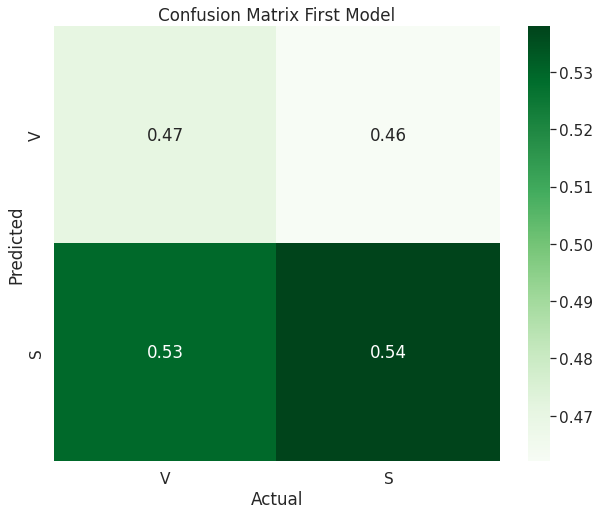

In [ ]:
df_cm = compute_modified_confusion_matrix(test_labels2, predictions)
df_cm  = df_cm / np.sum(df_cm, axis = 0)
df_cm
df_norm_col = pd.DataFrame(df_cm)
df_norm_col.columns = ['V', 'S']
df_norm_col.index = ['V', 'S']
df_norm_col.index.name = 'Predicted'
df_norm_col.columns.name = 'Actual'
plt.figure(figsize = (10,8))
plt.title("Confusion Matrix First Model")
sns.set(font_scale=1.4)
sns.heatmap(df_norm_col, cmap="Greens", annot=True,fmt='.2f')

The results of the second model are not promising, unfortunately

## 5.3 Classification Tree V vs S beats

In [ ]:
# # since the network gave unsatisfactory result, let's try to perform alternative methods to tell V vs S beats
# # let's try first with classification trees

# from sklearn import tree
# from sklearn.model_selection import GridSearchCV

# X = train_features2
# Y = train_labels2


# # Hyper parameters range intialization for tuning 
# parameters={"splitter":["best","random"],
#             "max_depth" : [5,10,20],
#            "min_samples_leaf":[5,10,20, 30, ]}

# #tuning_model=GridSearchCV(clf,param_grid=parameters,scoring='neg_mean_squared_error',cv=3,verbose=3)
# #the tuning is extremely time consuming, this was the best model:
# #{'max_depth': 5, 'min_samples_leaf': 30, 'splitter': 'random'}

# tuned_hyper_model= tree.DecisionTreeClassifier(max_depth=5, min_samples_leaf=30, splitter = 'random')
# tuned_hyper_model.fit(X,Y)

# from joblib import dump, load
# dump(tuned_hyper_model, '/content/drive/MyDrive/AI_in_Biomedicine/final assignment/experiments/classification_tree_ckpt.joblib')


In [ ]:
from joblib import dump, load
tuned_hyper_model = load('/content/drive/MyDrive/AI_in_Biomedicine/final assignment/ckpts/classification_tree_ckpt.joblib')


In [ ]:
pred = tuned_hyper_model.predict(test_features2)

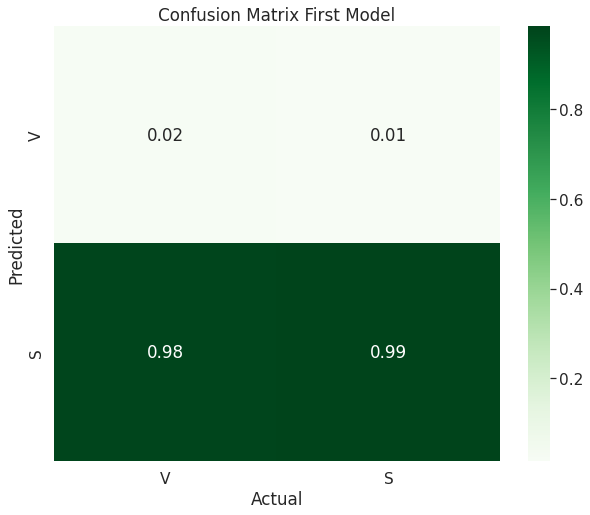

In [ ]:
df_cm = compute_modified_confusion_matrix(test_labels2, pred)
df_cm  = df_cm / np.sum(df_cm, axis = 0)
df_cm
#it always predict the same class, we won't use this model in the ensemble
df_norm_col = pd.DataFrame(df_cm)
df_norm_col.columns = ['V', 'S']
df_norm_col.index = ['V', 'S']
df_norm_col.index.name = 'Predicted'
df_norm_col.columns.name = 'Actual'
plt.figure(figsize = (10,8))
plt.title("Confusion Matrix First Model")
sns.set(font_scale=1.4)
sns.heatmap(df_norm_col, cmap="Greens", annot=True,fmt='.2f')

This classification tree predicts the same label each time so we are not going to use it in the final ensemble

## 5.4 Random Forest V vs S beats

In [ ]:
# #let's try with random forest
# from sklearn.ensemble import RandomForestClassifier
# from sklearn.datasets import make_classification
# X = train_features2
# Y = train_labels2
# random_forest = RandomForestClassifier(random_state=0, class_weight = "balanced_subsample")
# random_forest.fit(X, Y)

# dump(random_forest, '/content/drive/MyDrive/AI_in_Biomedicine/final assignment/experiments/random_forest_ckpt.joblib')


In [ ]:
random_forest = load('/content/drive/MyDrive/AI_in_Biomedicine/final assignment/ckpts/random_forest_ckpt.joblib')


In [ ]:
pred = random_forest.predict(test_features2)

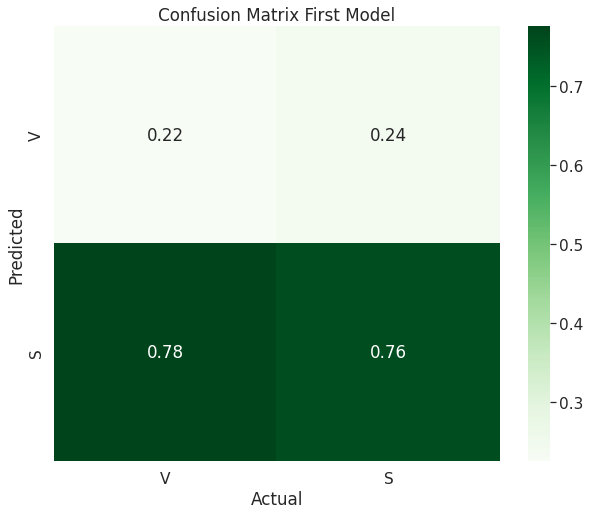

In [ ]:
df_cm = compute_modified_confusion_matrix(test_labels2, pred)
df_cm  = df_cm / np.sum(df_cm, axis = 0)
df_cm


df_norm_col = pd.DataFrame(df_cm)
df_norm_col.columns = ['V', 'S']
df_norm_col.index = ['V', 'S']
df_norm_col.index.name = 'Predicted'
df_norm_col.columns.name = 'Actual'
plt.figure(figsize = (10,8))
plt.title("Confusion Matrix First Model")
sns.set(font_scale=1.4)
sns.heatmap(df_norm_col, cmap="Greens", annot=True,fmt='.2f')
#the rf would have better performances predicting the opposite of what it predicts

## 5.5 KNN 

In [ ]:
# # let's try also with knn
# import sklearn.neighbors
# from sklearn.neighbors import KNeighborsClassifier
# #we dont want to consider all the features
# X = train_features2
# Y = train_labels2

# neigh = KNeighborsClassifier(n_neighbors=4, weights = 'distance')
# neigh.fit(X, Y)

# dump(neigh, '/content/drive/MyDrive/AI_in_Biomedicine/final assignment/experiments/knn_ckpt.joblib')


In [ ]:
neigh = load('/content/drive/MyDrive/AI_in_Biomedicine/final assignment/ckpts/knn_ckpt.joblib')

In [ ]:
pred = neigh.predict(test_features2)

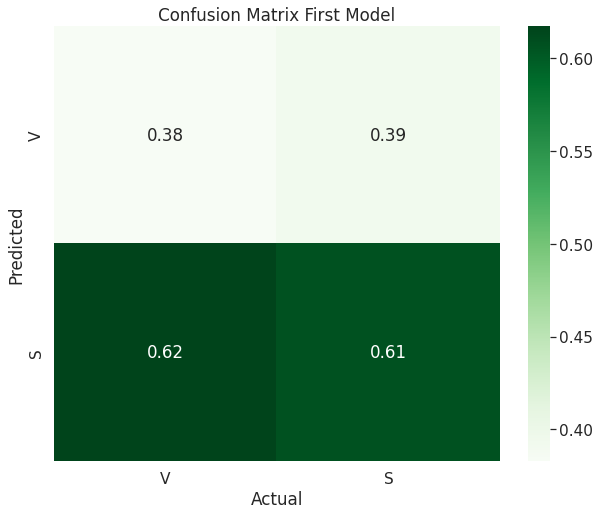

In [ ]:
df_cm = compute_modified_confusion_matrix(test_labels2, pred)
df_cm  = df_cm / np.sum(df_cm, axis = 0)
df_cm

df_norm_col = pd.DataFrame(df_cm)
df_norm_col.columns = ['V', 'S']
df_norm_col.index = ['V', 'S']
df_norm_col.index.name = 'Predicted'
df_norm_col.columns.name = 'Actual'
plt.figure(figsize = (10,8))
plt.title("Confusion Matrix First Model")
sns.set(font_scale=1.4)
sns.heatmap(df_norm_col, cmap="Greens", annot=True,fmt='.2f')


Both random forest and KNN models perform not so well, since, as shown by the confusion matrices, the main diagonal values are lower than the other one.

## 5.6 Ensemble

Average Voting with different weights for each model

In [ ]:
number_of_models = 3

preds_cv = np.empty([len(test_labels2),2,number_of_models-1])
trained_models = [resNet_deep_wide_model_train_2, random_forest, neigh]
#we dont consider the random forest

weights = [3,1, 1]
#we want the resnet model to have more impact since the other 2 models prediction 
#are very unbalanced in favour of S beats

for cv_n in range(number_of_models-1):
  model_temp = trained_models[cv_n + 1]
  
  pred_temp = model_temp.predict(test_features2)
  pred_temp = (pred_temp > 0.5)*1
  preds_cv[:, :, cv_n] = pred_temp * weights[cv_n + 1]


preds_cv = np.insert(preds_cv, number_of_models-1, weights[0] *(trained_models[0].predict([test_beats2, test_features2])>0.5)*1, axis=2)
preds_avg = np.sum(preds_cv, axis=2) / np.sum(weights)
preds_avg = (preds_avg > 0.5)*1

### 5.6.1 Results

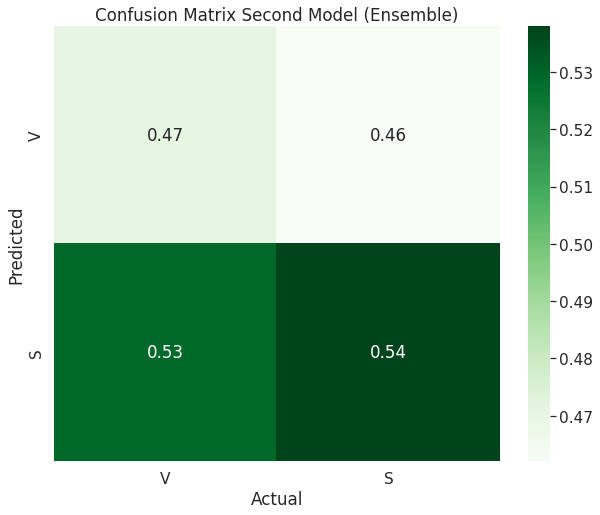

In [ ]:
df_cm = compute_modified_confusion_matrix(test_labels2, preds_avg)
df_cm = df_cm / np.sum(df_cm, axis = 0)
df_cm

df_norm_col = pd.DataFrame(df_cm)
df_norm_col.columns = ['V', 'S']
df_norm_col.index = ['V', 'S']
df_norm_col.index.name = 'Predicted'
df_norm_col.columns.name = 'Actual'
plt.figure(figsize = (10,8))
plt.title("Confusion Matrix Second Model (Ensemble)")
sns.set(font_scale=1.4)
sns.heatmap(df_norm_col, cmap="Greens", annot=True,fmt='.2f')

# 6) Final Model

**Inputs of the model**: 
- 2 ecg lead
- R peaks indexes

**Model functioning**:
1. Firstly, the ecg is filtered.
2. The peaks are repositioned.
3. Some global and local features are extracted from the ecg.
4. The heartbeats are extracted from the ecgs.
5. Apply to the extracted features the same transformation as the training set.
6. Finally, 2 different models are used:
 1. The first one to distinguish Normal(N) from Abnormal (V and S) beats.
 2. The second one  for the classification of V and S beats.

**Output**:
- labeling for the peaks

Test set loading

In [ ]:
#THIS IS WHERE WE WILL LOAD THE TEST SET

#Data Loading
from scipy.io import loadmat, savemat

import numpy as np, os, sys, joblib
"1 - Load data"
# Insert path of files containing the signals
input_directory = '/content/drive/MyDrive/AI_in_Biomedicine/final assignment/test_set/test_set_5'
#change the input directory


print('Loading data...')
header_files = []
for f in os.listdir(input_directory):
    g = os.path.join(input_directory, f)
    if not f.lower().startswith('.') and f.lower().endswith('mat') and os.path.isfile(g):
        header_files.append(g)
num_files_test = len(header_files)

# Create empty list for the files 
ecg_test = list()
rpk_test = list()

ids_test = list()   #list storing patients' IDs 

flag_fs_test = list()   #list storing 128 or 250 depending on ecg frequency

header_files.sort()
# Load the matlab files
for i in tqdm(range(num_files_test)):
    #print('Loading file: ' + str(i+1) + '/' + str(num_files))
    header = loadmat(header_files[i])
    if header_files[i].endswith('_rpk.mat'):
      rpk_test.append(header)
    else:
      ecg_test.append(header)
      ids_test.append(header_files[i].split('/')[-1][:4])
      if header_files[i].endswith('128.mat'):
        flag_fs_test.append('128')
      else:
        flag_fs_test.append('250')
        

Loading data...


  0%|          | 0/640 [00:00<?, ?it/s]

In [ ]:
print(len(ecg_test))
print(len(ids_test))
print(len(flag_fs_test))
print(num_files_test)



320
320
320
640


In [ ]:
def Final_Model(ecg, rpk, fs):

#-------------------------------------------------------------------------------
#1) Filters
  ecg_filtered = bandpass_filter(ecg, 1, 40, fs, 3)
  initial_features = ecg_feature_extractor2(ecg, rpk, fs)

  #ecg_feature_extractor2 is defined in section 5.1.1 
  #it extracts some global features of the ecg
#-------------------------------------------------------------------------------
#2) Peaks repositioning

  window_dim = int(initial_features[0] * fs/6) 
  #rule of thumb to create the window dim for the repositioning algo
  

  rpk_repositioned0, rpk_repositioned1, missed_beats0_tmp, missed_beats1_tmp = max_R_peak(window_dim, rpk, ecg_filtered)
  rpk_repositioned0 = np.array(rpk_repositioned0, dtype=int)
  rpk_repositioned1 = np.array(rpk_repositioned1, dtype=int)
  #adjusted_rpk_tmp0 contains the repositioned peaks for lead 0
  #adjusted_rpk_tmp1 contains the repositioned peaks for lead 1
  #sometimes happens that 2 peaks are very close to each other and only one of them is kept:
  #missed_beats0_tmp contains the missed beats for lead 0 
  #missed_beats1_tmp contains the missed beats for lead 1
  #We assume that whenever a beat is "missing" for lead 0 it is always missing also for lead 1
  #in order not to overcomplicate the code but we will check this assumption. 
  #we will classify these beats with the same label as the nearest one
#-------------------------------------------------------------------------------
#3) Feature Extraction and 4) heart-beats extraction
  
  
  global_features_lead0 = ecg_feature_extractor2(ecg_filtered, rpk_repositioned0, fs, lead =0)
  global_features_lead1 = ecg_feature_extractor2(ecg_filtered, rpk_repositioned1, fs, lead =1) 


  idx = diff_idx(ecg_filtered, rpk_repositioned0, fs) #lead0
  idx_fixed = np.zeros(shape = (idx.shape[0] + 2)).reshape(-1,1)
  idx_fixed[0] = global_features_lead0[0]
  idx_fixed[-1] = global_features_lead0[0]
  idx_fixed[1:-1] = idx[:]

  idx2 = diff_idx(ecg_filtered, rpk_repositioned1, fs) #lead1
  idx_fixed2 = np.zeros(shape = (idx2.shape[0] + 2)).reshape(-1,1)
  idx_fixed2[0] = global_features_lead1[0]
  idx_fixed2[-1] = global_features_lead1[0]
  idx_fixed2[1:-1] = idx2[:]

  beats_list = list()
  features_list = list()

  wd = 48 #96 is the total lenght of the array 
  #now for every peak we extract the portion of ecg from peak-wd to peak+wd 
  #see paragraph 2)
  for i in range(len(rpk_repositioned0)):

    peak = [int(rpk_repositioned0[i]), int(rpk_repositioned1[i])]
    # peak contains the peak index for the first and the second lead
    
    beat = extract_beats(peak, ecg_filtered, wd)
    beat = np.column_stack(beat)
    beats_list.append(beat)
    # beat is a list containing in each element of the list itself two portions of EGC
    # one portion for ech lead
    
    #here we collect some features 
    features_tot = list(global_features_lead0) #global features lead 0
    for j in global_features_lead1:
      features_tot.append(j)             #global features lead 1
      
    features_tot.append(float(idx_fixed[i]))
    features_tot.append(float(idx_fixed[i+1]))

    features_tot.append(float(idx_fixed2[i]))
    features_tot.append(float(idx_fixed2[i+1]))

    features_tot.append(float(ecg_filtered[rpk_repositioned0[i], 0]))
    features_tot.append(float(ecg_filtered[rpk_repositioned1[i], 1]))
      

    min0 = min(beat[:,0])
    min1 = min(beat[:,1])
    diff0 = float(ecg_filtered[rpk_repositioned0[i], 0]) - min0
    diff1 = float(ecg_filtered[rpk_repositioned1[i], 1]) - min1

    # area underneath the curve standardized with the average value of the peaks of the patient(global_features[1])
    #it's computed for each lead
    area_under_the_curve0 = np.sum(abs(beat[:,0]) / int(fs) / abs(float(global_features_lead0[1])))
    area_under_the_curve1 = np.sum(abs(beat[:,1]) / int(fs) / abs(float(global_features_lead1[1])))
    features_tot.append(min0)
    features_tot.append(min1)
    features_tot.append(diff0)
    features_tot.append(diff1)
    features_tot.append(area_under_the_curve0)
    features_tot.append(area_under_the_curve1)
    features_list.append(features_tot)

  features = np.asarray(features_list)
  beats = np.asarray(beats_list)

 #-------------------------------------------------------------------------------
 #5) Apply the same transformation: 
  features = transformer.transform(features)
 #-------------------------------------------------------------------------------
 #6) Prediction

  test_set = generate_test_data(beats,features)
  #predict with the first model
  y_pred = resNet_deep_wide_model_train_1.predict(test_set)
  predictions1 = y_pred
  predicted_labels = np.empty(shape = y_pred.shape[0], dtype=str)

  v = np.arange(y_pred.shape[0])
  v_not_n = v[y_pred[:,0]<=0.5] #indexes of the not-N beats
  v_N = v[y_pred[:,0]>0.5] #indexes of the N beats
  predicted_labels[v_N] = 'N'

  #if there are not-N beats, classify them with the ensemble:
  if v_not_n.shape[0]>0:
    test_set_second_model = generate_test_data(beats[v_not_n], features[v_not_n])
    
    #Prediction with the ensemble(same code of 5.6):
    number_of_models = 3

    preds_cv = np.empty([v_not_n.shape[0],2,number_of_models-1])
    trained_models = [resNet_deep_wide_model_train_2, random_forest, neigh]
    #we dont consider the classification tree

    weights = [3,1, 1]
    #we want the resnet model to have more impact since the other 2 models predictions are very unbalanced towards S beats

    for cv_n in range(number_of_models-1):
      model_temp = trained_models[cv_n + 1]
    
      pred_temp = model_temp.predict(test_set_second_model['wide_features'])
      pred_temp = (pred_temp > 0.5)*1
      preds_cv[:, :, cv_n] = pred_temp * weights[cv_n + 1]

    preds_cv = np.insert(preds_cv, number_of_models-1, weights[0] *(trained_models[0].predict(test_set_second_model)>0.5)*1, axis=2)
    preds_avg = np.sum(preds_cv, axis=2) / np.sum(weights)
    preds_avg = (preds_avg > 0.5)*1

    predicted_labels[v_not_n[preds_avg[:,0]>=0.5]] = 'V'
    predicted_labels[v_not_n[preds_avg[:,0]<0.5]] = 'S'

  
  for peak in missed_beats0_tmp:
    #find the closest peak for every missed peak and assign the same label
    v0 = abs(rpk_repositioned0 - peak)
    v1 = abs(rpk_repositioned1 - peak)
    m0 = np.argmin(v0)
    m1 = np.argmin(v1)
    if abs(m0-peak)>=abs(m1-peak):
      predicted_labels = np.insert(predicted_labels, m1+1, predicted_labels[m1])
    else:
      predicted_labels = np.insert(predicted_labels, m0+1, predicted_labels[m0])


  return predicted_labels


In [ ]:
import warnings
warnings.filterwarnings('ignore')
labels = list()
for i in tqdm(range(int(num_files_test/2))):
  labels.append(Final_Model(ecg_test[i]['ecg'], rpk_test[i]['rpeaks'], int(flag_fs_test[i])))




  0%|          | 0/320 [00:00<?, ?it/s]

change the format of the labels:

In [ ]:
for i in range(int(num_files_test/2)):
  final_labels = {'items': labels[i]}
  exp_dir = "/content/drive/MyDrive/AI_in_Biomedicine/final assignment/results/"
  if not os.path.exists(exp_dir):
    os.makedirs(exp_dir)

  savemat(file_name= exp_dir + str(ids_test[i]) + "_" + str(flag_fs_test[i]) + "_ann" + ".mat", mdict = final_labels, appendmat=False)

Counter({1800.0: 12, 1800.004: 308})

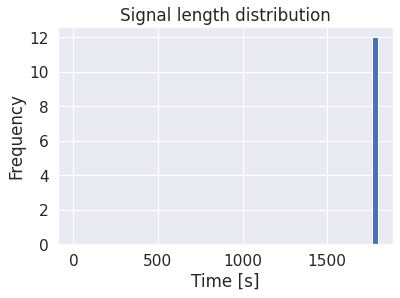

In [ ]:
"Plot ecg length distribution"
# list for storing different recording lenghts
length_recordings = list()

# Iterate through the different signals stored in "recordings": store signal length
# and divide by sampling frequency to obtain it in senconds
for i,rec_temp in enumerate(ecg_test):
  length_recordings.append(len(rec_temp['ecg'][:,0])/int(flag_fs_test[i]))

# Transform to pandas series and plot the histogram
length_rec_s = pd.Series(length_recordings)
ax = length_rec_s.plot.hist(bins=50, alpha=1, range=[0,1800])
ax.set_xlabel("Time [s]")
ax.set_title("Signal length distribution")
display(Counter(length_rec_s)) 
#as shown in the plot, every signal has the same length

In [ ]:
N=0
V=0
S=0
for i in range(320):
  N = N + np.sum(labels[i] == 'N')
  V = V + np.sum(labels[i] == 'V')
  S = S + np.sum(labels[i] == 'S')

print(N/(N+V+S))
print(V/(N+V+S))
print(S/(N+V+S))

0.9431872139923922
0.028860352627486995
0.027952433380120743


## 6.1 Test set analysis

In [ ]:
id = np.array(ids_test)
v = np.arange(320)
v[(id == "T034")]

array([14])

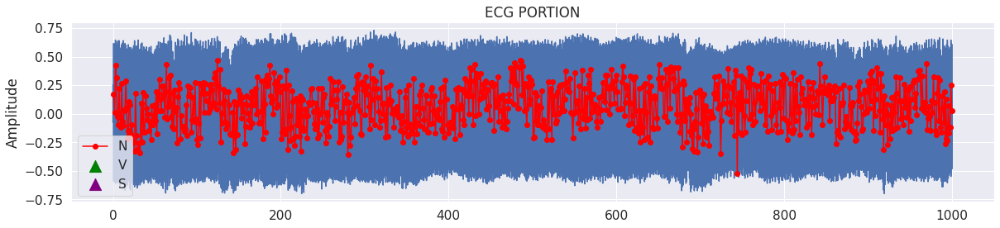

In [ ]:
patient = 14
start = 0
stop = 1000
lead = 0


plot_ecg2(ecg_test[patient]['ecg'][:,lead], labels[patient],int(flag_fs_test[patient]), rpk_test[patient]['rpeaks'], start, stop)

In [ ]:
features_rhythm = list()  #list for storing features extracted
num_files = 320
#extract features from each ecg lead 0
for i in range(num_files):
  ecg = ecg_test[i]['ecg']
  fs = int(flag_fs_test[i])
  tmp = ecg_feature_extractor(ecg, rpk_test[i]["rpeaks"], fs,0)
  features_rhythm.append(tmp)

features_rhythm = np.array(features_rhythm)
features_rhythm = pd.DataFrame(features_rhythm, columns =['mean_RR', 'mean_peaks', 'median_RR', 'median_Peaks',
                                                          'var_RR', 'var_peaks','skew_RR', 'skew_Peaks',
                                                          'kurt_RR', 'kurt_Peaks','min_RR',  'n_beats'])


features_lead0_test = pd.concat([header_data, features_rhythm], axis=1)

In [ ]:
import time 
t0 = time.time() #stores starting time


adjusted_rpk_test = list()

missed_beats_test = [None] *320 
#list for storing the indexes of peaks that were removed by the function for peaks repositioning 

for patient in tqdm(range(320)):
  fs = int(flag_fs_test[patient])
  #compute for each patient the minimum distance between two peaks and take as window_dim a smaller number
  #print("Adjusting patient " + str(patient+1) + '/' + str(num_files))
  ecg = ecg_test[patient]['ecg']
  window_dim = int(features_lead0_test.mean_RR[patient] * fs/6) #rule of thumb for deciding the window size
  
  #calling max_R_peak function for the repositioning
  adjusted_rpk_tmp0, adjusted_rpk_tmp1, missed_beats0_tmp, missed_beats1_tmp = max_R_peak(window_dim, rpk_test[patient]['rpeaks'], ecg)


  
  adjusted_rpk_tmp0 = np.array(adjusted_rpk_tmp0, dtype = int)
  adjusted_rpk_tmp1 = np.array(adjusted_rpk_tmp1, dtype = int)
  
  adjusted_rpk_test.append([adjusted_rpk_tmp0, adjusted_rpk_tmp1])
  missed_beats_test[patient]=[missed_beats0_tmp, missed_beats1_tmp]

time_taken = time.time() - t0 #computing the execution time of this cell
print("Time taken: " + str("{:.2f}".format(time_taken)) + " seconds")

  0%|          | 0/320 [00:00<?, ?it/s]

Time taken: 160.73 seconds


In [ ]:
#if the beat belongs to the missed_beats list then we also need to remove its label
missed_beats_patient = list()
for i in range(105):
  missed_beats_patient.append(missed_beats[i] != [[],[]])

idx = np.arange(0,105)

#adjusted labels are the labels that do not consider the missed beats
adjusted_labels_test = [labels[patient] for patient in range(320)]

for i in idx[missed_beats_patient]: #considering only the indexes of patients who got peaks removed
  for peak in (missed_beats_test[i][0]):
    #In general we discovered that when a peak is missing, it is missing for both leads,
    #so we just check lead 0
    l = rpk_test[i]['rpeaks'] != peak
    adjusted_labels_test[i] = adjusted_labels_test[i][[val for sublist in l for val in sublist]]

In [ ]:
adjusted_features_test = list()
lead = 0
num_files = 320
#using ecg_feature_extractor(ecg, peaks_file, fs, lead =0) with the adjusted_peaks file
for i in range(num_files):
  fs = int(flag_fs_test[i])
  tmp = ecg_feature_extractor(ecg_test[i]['ecg'], adjusted_rpk_test[i][lead], fs, lead)
  adjusted_features_test.append(tmp)
adjusted_features_test = np.array(adjusted_features_test)
adjusted_features_test = pd.DataFrame(adjusted_features_test, columns = ['mean_RR', 'mean_peaks', 'median_RR', 'median_Peaks',
                                                          'var_RR', 'var_peaks','skew_RR', 'skew_Peaks',
                                                          'kurt_RR', 'kurt_Peaks','min_RR',  'n_beats'])

features_test = pd.concat([header_data, adjusted_features_test], axis=1)
np.sum(features_test.n_beats - features_lead0_test.n_beats !=0)
#there are only 4 patient with different number of beats

0

In [ ]:
# we call global features the features that we are given since the beginning (eg mean, median, skewness, ..)
# we want to create new features according to the attributes that we deem 
# important in order to clusterize heartbeats, for example the single hearthbeats amplitude and 
# the distance from the previous and the next beat.


lead = 0



for patient in tqdm(range(320)):
  idx = adjusted_rpk_test[patient][lead]
  l = adjusted_labels_test[patient]

  #computing labels occurrences for each patient 
  N_points_idx = (l == 'N')
  V_points_idx = (l == 'V')
  S_points_idx = (l == 'S')

  idx_diff_x = np.diff(idx[:-1], axis = 0) #out[i] = a[i+1] - a[i]
  # [0, 5, 3, 4]--> diff_x = [5,-2]
  idx_diff_y = np.diff(idx[1:], axis = 0) # out[i] = a[i] - a[i-1]
  # [0, 5, 3, 4]--> diff_y = [-2, 1]
  peaks_amplitude = ecg_test[patient]['ecg'][idx[1:-1],lead]

  #come si puo vedere dall'esempio in posizione 0 ho la distanza di 5 dal precedente sull'asse x e dal successivo sull'asse y
  fig = plt.figure(figsize = (8,8))
  ax = fig.add_subplot(111, projection='3d')
  ax.set_xlabel("distance from the previous peak")
  ax.set_ylabel("distance from the following peak")
  ax.set_zlabel("peak amplitude")
  ax.scatter(idx_diff_x[N_points_idx[1:-1]], idx_diff_y[N_points_idx[1:-1]], peaks_amplitude[N_points_idx[1:-1]], label ='N', color = 'blue', alpha = 0.5, s = 50)
  ax.scatter(idx_diff_x[V_points_idx[1:-1]], idx_diff_y[V_points_idx[1:-1]], peaks_amplitude[V_points_idx[1:-1]], label = 'V', color = 'red', alpha = 0.5, s = 50)
  ax.scatter(idx_diff_x[S_points_idx[1:-1]], idx_diff_y[S_points_idx[1:-1]], peaks_amplitude[S_points_idx[1:-1]], label = 'S', color = 'green', alpha = 0.5, s = 50)
  ax.set_title("Patient: " +str(ids_test[patient]))
  ax.legend()